In [1]:
#import the necessary packages 
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
import statsmodels.api as sm
import scipy
import re
from datetime import datetime as dttime
from datetime import date
import calendar
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import mutual_info_classif,SelectKBest
from sklearn.linear_model import Ridge
from sklearn.linear_model import LinearRegression 
from sklearn.linear_model import Lasso
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor 
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from math import sqrt
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from dateutil.relativedelta import *
from sklearn import metrics
from sklearn.neighbors import BallTree
from sklearn.datasets import make_regression
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import mutual_info_regression
from matplotlib import pyplot
import pandas as pd
#import geopandas
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)

<div ><img src="Repsol-Logo.png" width=300 height=200  style="border-radius:5%"></div>

# Fuel Demand & Pricing - Repsol

**Description:** Data competition -- Repsol Fuel pricing

**Time:** 3 Days 

**Contact:**  <br>  Pierre Mulliez: pierremulliez@student.ie.edu <br> Mate Villic: mate.vilic@student.ie.edu <br> Elsa Arnaiz: elsaarnaiz@student.ie.edu <br> Olga Frech: olga.frech@student.ie.edu <br> Alienor Duron: alienor@student.ie.edu <br> German German: ggerman.souza@student.ie.edu <br>Andrei Menshchikov andreimenshchikov@student.ie.edu <br> Jorge Campos: jorge.campos@student.ie.edu
 

**Client:** Repsol 

**Code created:** 2021-03-15 <br>

**Last updated:** 2021-03-18

# Executive Summary
Repsol has a leadership position in the Spanish Service Stations (SS) market, but with a declining share.
The average volume sold per SS has decreased due to four main external market factors: i) sustained growth and increased penetration of low price players (mainly cooperatives, hypermarkets and independent), ii) customers' changing perception on price as a result of increased access to technology tools that enable price comparisons, iii) strong regulatory framework that ensures a constant supply of energy at the lowest possible cost, iv) loyalty programs shifting the value proposition and customers' behavior. Spanish fuel market dynamics have evolved to become highly competitive with prices changes 1/day.

Repsol faces the challenge of managing pricing optimization by micromarkets and considering competitors pricing behavior. We will conduct an analysis focused on the relationship between price and demand and develop a time series predictive model to generate sales forecats in three time windows: +7 days, +30 days, +180 days.

# Data Loading and Preprocessing
We have two main datasets:

**DATASET_REP**
The dataset provided of Repsol data contains the following timeseries with daily granularity.
- Date: Reference date %m/%d/%y (2016-2019)
- Code: Code of Province of Spain (PoS)
- Province: Name of the province ("A Coruña")
- Longitude: Location of the POS
- Latitude: Location of the POS
- Red: Supplier/Brand
- Gasoline Demand: Normalized (0-1) volume sold
- Gasoline Price: Gasoline pump price
- Diesel Demand: Normalized (0-1) volume sold
- Diesel: Diesel pump price

**DATASET_COMP**
- Similar to the other dataset but for the POS of competitors and only containing prices (not demand)

Let's load and inspect the datasets.

In [2]:
#Import the dataset
df = pd.read_excel('Dataset_REP.xlsx')

In [3]:
#assigning df to another var / avoid reloading the dataset if an eroor arises 
df1 = df.copy()
name_graph = "Fuel prices"
target = "Diesel price"
target_2 = "Gasoline price"
gd = "Gasoline demand"
dd = "Diesel demand"

# Data Inspection
## Understanding the dataset

In [4]:
#datetime to unix for performance
import datetime
df1['Date']  = df1['Date'].astype('datetime64[ns]')
df1['dateunix'] = (df1['Date'].apply(lambda x: x.toordinal()) - datetime.date(1970, 1, 1).toordinal()) * 24*60*60

In [5]:
print(df1.head())
#grouping price and demand for visualization
df2 = df1.groupby( ['Date']).mean()
df2.reset_index(inplace=True)
print("")
print("Size of grouped dataset: " + str(len(df2)))

        Date    Code  Province  Longitude   Latitude  Red  Gasoline demand  \
0 2016-01-01  ES1015  A Coruña  -8.413606  43.367618  REP              0.0   
1 2016-01-02  ES1015  A Coruña  -8.413606  43.367618  REP              0.0   
2 2016-01-03  ES1015  A Coruña  -8.413606  43.367618  REP              0.0   
3 2016-01-04  ES1015  A Coruña  -8.413606  43.367618  REP              0.0   
4 2016-01-05  ES1015  A Coruña  -8.413606  43.367618  REP              0.0   

   Gasoline price  Diesel demand  Diesel price    dateunix  
0           1.169            0.0         0.999  1451606400  
1           1.169            0.0         0.999  1451692800  
2           1.169            0.0         0.999  1451779200  
3           1.169            0.0         0.999  1451865600  
4           1.169            0.0         1.009  1451952000  

Size of grouped dataset: 1461


In [6]:
#Describe qualitative features of the dataset
df.describe(include=[object]).T

,count,unique,top,freq
Code,61714,43,ES1019,1461
Province,61714,1,A Coruña,61714
Red,61714,1,REP,61714


In [7]:
#Describe quantitative features of the dataset
df.describe(exclude=[np.object]).T

C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  


,count,unique,top,freq,first,last,mean,std,min,25%,50%,75%,max
Date,61714,1461,2019-03-19,43,2016-01-01,2019-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Longitude,61714.0,NaN,NaT,NaN,NaT,NaT,-8.42079,0.304149,-9.26786,-8.479238,-8.393727,-8.221867,-7.846165
Latitude,61714.0,NaN,NaT,NaN,NaT,NaT,43.244739,0.205062,42.554729,43.157679,43.31749,43.357306,43.51217
Gasoline demand,61714.0,NaN,NaT,NaN,NaT,NaT,0.289994,0.270741,-1.718524,0.0,0.293497,0.522928,1.0
Gasoline price,61259.0,NaN,NaT,NaN,NaT,NaT,1.280839,0.069293,1.079,1.229,1.289,1.339,1.429
Diesel demand,61714.0,NaN,NaT,NaN,NaT,NaT,0.319403,0.295897,-2.991468,0.0,0.33354,0.591113,1.0
Diesel price,61259.0,NaN,NaT,NaN,NaT,NaT,1.183833,0.089192,0.919,1.119,1.199,1.259,1.369


In [8]:
# shape of the dataframe
size = df1.shape
print("Size of the Dataframe -> {}".format(size))

Size of the Dataframe -> (61714, 11)


In [9]:
# column data types
df1.dtypes

Date               datetime64[ns]
Code                       object
Province                   object
Longitude                 float64
Latitude                  float64
Red                        object
Gasoline demand           float64
Gasoline price            float64
Diesel demand             float64
Diesel price              float64
dateunix                    int64
dtype: object

In [10]:
df1.head()

,Date,Code,Province,Longitude,Latitude,Red,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix
0,2016-01-01,ES1015,A Coruña,-8.413606,43.367618,REP,0.0,1.169,0.0,0.999,1451606400
1,2016-01-02,ES1015,A Coruña,-8.413606,43.367618,REP,0.0,1.169,0.0,0.999,1451692800
2,2016-01-03,ES1015,A Coruña,-8.413606,43.367618,REP,0.0,1.169,0.0,0.999,1451779200
3,2016-01-04,ES1015,A Coruña,-8.413606,43.367618,REP,0.0,1.169,0.0,0.999,1451865600
4,2016-01-05,ES1015,A Coruña,-8.413606,43.367618,REP,0.0,1.169,0.0,1.009,1451952000


In [11]:
df1.tail()

,Date,Code,Province,Longitude,Latitude,Red,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix
61709,2019-12-27,ES1063,A Coruña,-8.13456,43.239296,REP,0.232282,1.369,0.465074,1.315,1577404800
61710,2019-12-28,ES1063,A Coruña,-8.13456,43.239296,REP,0.357799,1.369,0.281308,1.319,1577491200
61711,2019-12-29,ES1063,A Coruña,-8.13456,43.239296,REP,0.348447,1.369,0.279371,1.319,1577577600
61712,2019-12-30,ES1063,A Coruña,-8.13456,43.239296,REP,0.281199,1.369,0.509981,1.319,1577664000
61713,2019-12-31,ES1063,A Coruña,-8.13456,43.239296,REP,0.285524,1.379,0.379911,1.329,1577750400


In [12]:
df1.sample(25)

,Date,Code,Province,Longitude,Latitude,Red,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix
55125,2017-12-13,ES1059,A Coruña,-8.478708,43.317213,REP,0.512965,1.279,0.541273,1.209,1513123200
9710,2016-12-01,ES1023,A Coruña,-9.112799,43.140524,REP,0.000000,1.229,0.000000,1.119,1480550400
54715,2016-10-28,ES1059,A Coruña,-8.478708,43.317213,REP,0.657439,1.234,0.739934,1.134,1477612800
22150,2019-02-03,ES1031,A Coruña,-8.349088,43.099610,REP,0.276573,1.289,0.228217,1.249,1549152000
26885,2016-04-30,ES1037,A Coruña,-8.237407,43.028088,REP,0.000000,1.219,0.000000,1.079,1461974400
23076,2017-08-17,ES1032,A Coruña,-8.351632,43.097840,REP,0.658944,1.259,0.847468,1.125,1502928000
47525,2017-02-06,ES1054,A Coruña,-8.529408,43.275401,REP,0.198411,1.299,0.437904,1.179,1486339200
43933,2019-04-06,ES1051,A Coruña,-8.416333,43.336528,REP,0.000000,1.339,0.000000,1.269,1554508800
43863,2019-01-26,ES1051,A Coruña,-8.416333,43.336528,REP,0.000000,1.249,0.000000,1.209,1548460800
20897,2019-08-30,ES1030,A Coruña,-8.445535,43.339989,REP,0.466029,1.339,0.492299,1.219,1567123200


In [13]:
df1.isnull().sum()

Date                 0
Code                 0
Province             0
Longitude            0
Latitude             0
Red                  0
Gasoline demand      0
Gasoline price     455
Diesel demand        0
Diesel price       455
dateunix             0
dtype: int64

## Understanding the variables


In [14]:
# ! pip install pandas-profiling

from pandas_profiling import ProfileReport
report = ProfileReport(df1, minimal=False)
# report

### Correlation Matrix

In [15]:
rs = np.random.RandomState(0)
corr = df1.corr()
corr.style.background_gradient(cmap='RdBu_r')

,Longitude,Latitude,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix
Longitude,1.000000,0.616394,0.119489,0.007409,0.156972,0.007645,-0.008162
Latitude,0.616394,1.000000,0.123811,0.009794,0.064477,0.003942,0.000148
Gasoline demand,0.119489,0.123811,1.000000,0.196709,0.864618,0.186247,0.292625
Gasoline price,0.007409,0.009794,0.196709,1.000000,0.152468,0.941997,0.766765
Diesel demand,0.156972,0.064477,0.864618,0.152468,1.000000,0.145564,0.223982
Diesel price,0.007645,0.003942,0.186247,0.941997,0.145564,1.000000,0.844494
dateunix,-0.008162,0.000148,0.292625,0.766765,0.223982,0.844494,1.000000


## Data visualizations

61714
0
count    61714.000000
mean         0.319403
std          0.295897
min         -2.991468
25%          0.000000
50%          0.333540
75%          0.591113
max          1.000000
Name: Diesel demand, dtype: float64


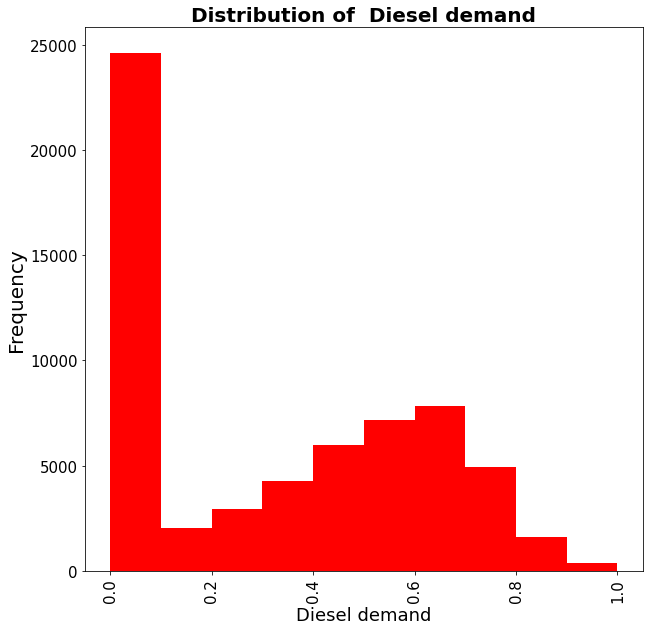

skeweness test 
0.16058727536210576, we have a normally dirtibutted target variable!


In [16]:
from matplotlib import pyplot 
#size of rba
print(len(df1[dd]))
#number of nulls
print(df1[dd].isnull().sum())
#other stat
print(df1[dd].describe())


bins = 10
rbahist = df1[dd].hist(bins = bins, figsize = (10, 10),
                                   grid = False,facecolor='r',range=(0,1))
#set x axis legend to the median of the bin
plt.xticks(rotation=90,fontsize=15)
plt.yticks(fontsize=15)
rbahist.set_xlabel(dd,fontsize=18)
rbahist.set_ylabel(('Frequency') ,fontsize=20)
rbahist.set_title('Distribution of  ' + dd,fontsize=20,weight='bold')
plt.show()

print("skeweness test ")
data = pd.to_numeric(df1[dd], downcast='integer')
print(str(scipy.stats.skew(data)) + ", we have a normally dirtibutted target variable!")


61714
0
count    61714.000000
mean         0.289994
std          0.270741
min         -1.718524
25%          0.000000
50%          0.293497
75%          0.522928
max          1.000000
Name: Gasoline demand, dtype: float64


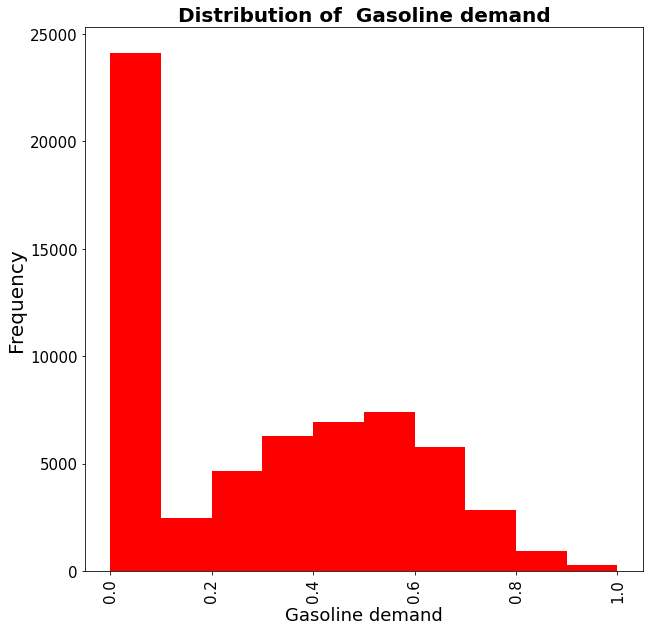

skeweness test 
0.27458504964742003, we have a normally dirtibutted target variable!


In [17]:
from matplotlib import pyplot 
#size of rba
print(len(df1[gd]))
#number of nulls
print(df1[gd].isnull().sum())
#other stat
print(df1[gd].describe())


bins = 10
rbahist = df1[gd].hist(bins = bins, figsize = (10, 10),
                                   grid = False,facecolor='r',range=(0, 1))
#set x axis legend to the median of the bin
plt.xticks(rotation=90,fontsize=15)
plt.yticks(fontsize=15)
rbahist.set_xlabel(gd,fontsize=18)
rbahist.set_ylabel(('Frequency') ,fontsize=20)
rbahist.set_title('Distribution of  ' + gd,fontsize=20,weight='bold')
plt.show()

print("skeweness test ")
data = pd.to_numeric(df1[gd], downcast='integer')
print(str(scipy.stats.skew(data)) + ", we have a normally dirtibutted target variable!")

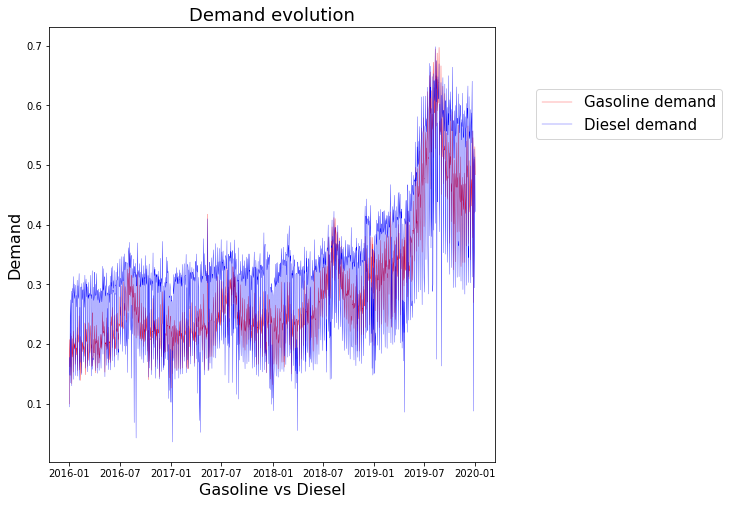

In [18]:
#gasoline and Diesel demand over time 
x = df2['Date']
y = df2[gd]
y2 = df2[dd]
plt.rcParams["figure.figsize"] = (8,8)
plt.plot(x, y, color= "r",label = gd,lw = 0.3)
plt.plot(x, y2, color= "b",label = dd,lw = 0.3)
plt.xlabel("Gasoline vs Diesel",fontsize = 16)
plt.ylabel('Demand',fontsize = 16)
plt.legend(bbox_to_anchor=(1.3, 0.80), loc='center', borderaxespad=0., fontsize = 15)
plt.title("Demand evolution",fontsize = 18)
plt.show()

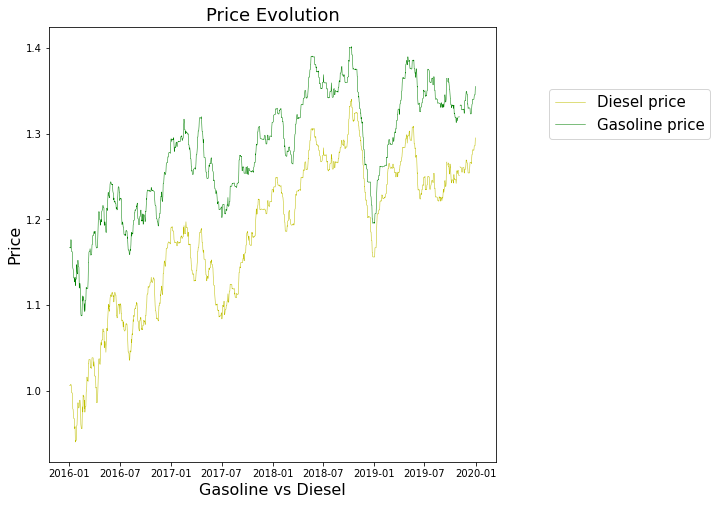

In [19]:
#Gasoline / Diesel price over time 
x = df2['Date']
y = df2[target]
y2 = df2[target_2]
plt.rcParams["figure.figsize"] = (8,8)
plt.plot(x, y, color= "y",label = target,lw = 0.5)
plt.plot(x, y2, color= "g",label = target_2,lw = 0.5)
plt.xlabel("Gasoline vs Diesel",fontsize = 16)
plt.ylabel('Price',fontsize = 16)
plt.legend(bbox_to_anchor=(1.3, 0.80), loc='center', borderaxespad=0., fontsize = 15)
plt.title("Price Evolution",fontsize = 18)
plt.show()

In [1]:
#Gasoline / Diesel price over time 
x = df2['Date']
y = df2[target]
y2 = df2[target_2]
plt.rcParams["figure.figsize"] = (8,8)
plt.plot(x, y, color= "y",label = target,lw = 0.5)
plt.plot(x, y2, color= "g",label = target_2,lw = 0.5)
plt.xlabel("Gasoline vs Diesel",fontsize = 16)
plt.ylabel('Price',fontsize = 16)
plt.legend(bbox_to_anchor=(1.3, 0.80), loc='center', borderaxespad=0., fontsize = 15)
plt.title("Price Evolution",fontsize = 18)
plt.show()

NameError: name 'df2' is not defined

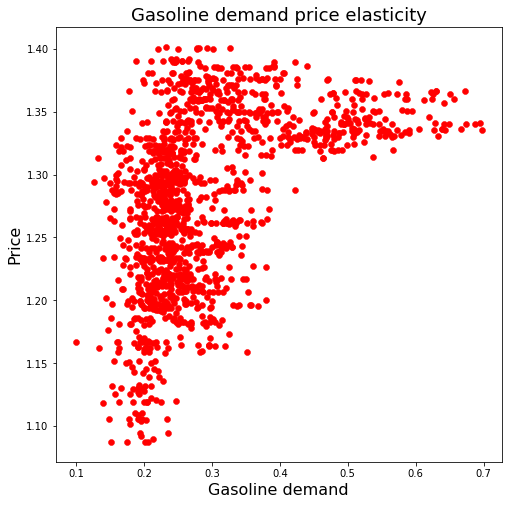

In [20]:
## Inspecting elasticity 
#Gasoline
x = df2[gd]
y = df2[target_2]
plt.rcParams["figure.figsize"] = (8,8)
plt.scatter(x, y, color= "r",label = None,linewidths = 0.5)
plt.xlabel(gd,fontsize = 16)
plt.ylabel('Price',fontsize = 16)
plt.title(gd + " price elasticity",fontsize = 18)
plt.show()

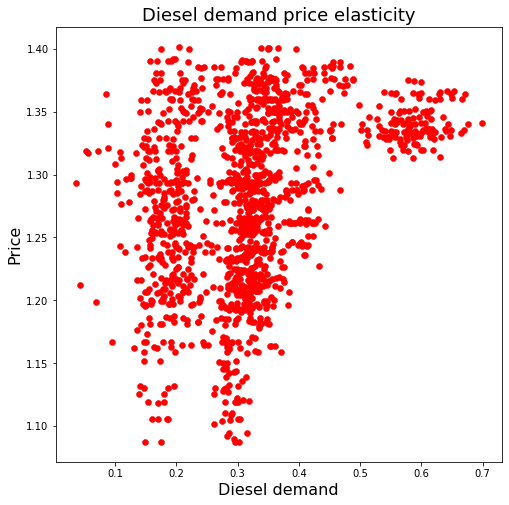

In [21]:
#Diesel 
x = df2[dd]
plt.rcParams["figure.figsize"] = (8,8)
plt.scatter(x, y, color= "r",label = None,linewidths = 0.5)
plt.xlabel(dd,fontsize = 16)
plt.ylabel('Price',fontsize = 16)
plt.title(dd + " price elasticity",fontsize = 18)
plt.show()

## Location areas

In [22]:
#region capital 
#la coruna, santiago de compostela and ferrol respectively to their indexes int he array
x2 = [43.3623,42.8782,43.4896]
y2 = [-8.396,-8.5448,-8.2193]

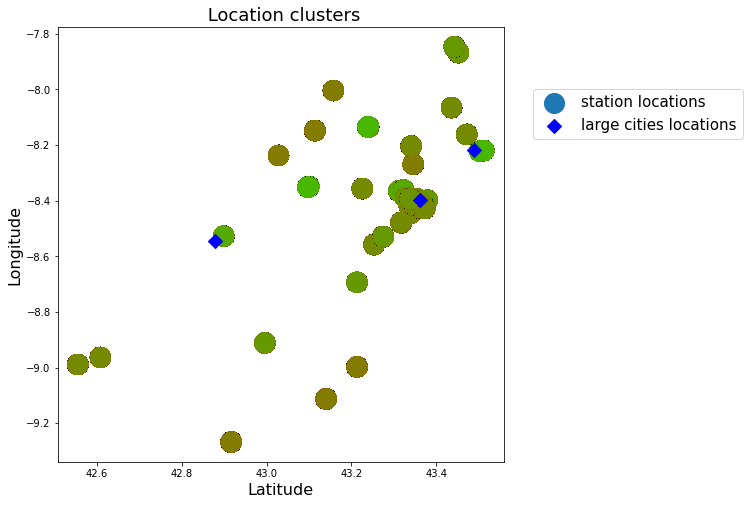

In [23]:
#using longitude and latitude 
#color scale by gasoline price
x = df1['Latitude']
y= df1['Longitude']
plt.rcParams["figure.figsize"] = (8,8)
plt.scatter(x, y,label = "station locations",linewidths = 1, c= df1[target_2],s= 400 ,cmap="brg")
plt.scatter(x2, y2, color= "b",label = "large cities locations",linewidths = 1,marker = 'D',s=100)
plt.xlabel("Latitude",fontsize = 16)
plt.ylabel('Longitude',fontsize = 16)
plt.legend(bbox_to_anchor=(1.3, 0.80), loc='center', borderaxespad=0., fontsize = 15)
plt.title( " Location clusters",fontsize = 18)
plt.show()

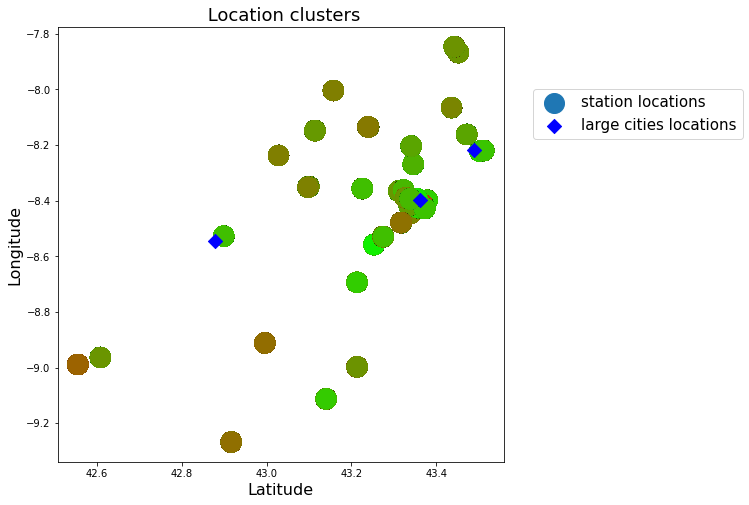

In [24]:
#using longitude and latitude 
#color scale by gasoline demand
x = df1['Latitude']
y= df1['Longitude']
plt.rcParams["figure.figsize"] = (8,8)
plt.scatter(x, y,label = "station locations",linewidths = 1, c= df1[gd],s= 400 ,cmap="brg")
plt.scatter(x2, y2, color= "b",label = "large cities locations",linewidths = 1,marker = 'D',s=100)
plt.xlabel("Latitude",fontsize = 16)
plt.ylabel('Longitude',fontsize = 16)
plt.legend(bbox_to_anchor=(1.3, 0.80), loc='center', borderaxespad=0., fontsize = 15)
plt.title( " Location clusters",fontsize = 18)
plt.show()

In [25]:
df1['Latitude']

0        43.367618
1        43.367618
2        43.367618
3        43.367618
4        43.367618
           ...    
61709    43.239296
61710    43.239296
61711    43.239296
61712    43.239296
61713    43.239296
Name: Latitude, Length: 61714, dtype: float64

In [26]:
df2['Date'].dt.year.apply(int)

0       2016
1       2016
2       2016
3       2016
4       2016
        ... 
1456    2019
1457    2019
1458    2019
1459    2019
1460    2019
Name: Date, Length: 1461, dtype: int64

# Feature Creation

## Creating variables from the original ones

In [27]:
df1['Month'] = df1['Date'].dt.month.apply(int)
df1['Weekday'] = df1['Date'].dt.weekday.apply(int)
df1['Day'] = df1['Date'].dt.day.apply(int)
df1['Year'] = df1['Date'].dt.year.apply(int)
#Grouped dataset date 
df2['Month'] = df2['Date'].dt.month.apply(int)
df2['Weekday'] = df2['Date'].dt.weekday.apply(int)
df2['Day'] = df2['Date'].dt.day.apply(int)
df2['Year'] = df2['Date'].dt.year.apply(int)

In [28]:
# adding feature to consider season
def season(x):
    if x == 12 or x == 1 or x == 2:
        return 'Winter'
    elif x == 3 or x == 4 or x == 5:
        return 'Spring'
    elif x == 6 or x == 7 or x== 8:
        return 'Summer'
    else:
        return 'Fall'
    
df1['season'] = df1['Month'].apply(season)
df2['season'] = df2['Month'].apply(season)

In [29]:
# adding feature for sunday because trucks aren't allowed to transit on this day 
def sunday(x):
    if x == 6:
        return 1
    else:
        return 0

df1['Sunday'] = df1['Weekday'].apply(sunday)
df2['Sunday'] = df2['Weekday'].apply(sunday)

## We did not run the Geopoint package because the packages do not work properly together 

# code to create the geopoint
#!pip install geopandas
gdf = geopandas.GeoDataFrame(
    df1, geometry=geopandas.points_from_xy(df1.Longitude, df1.Latitude))
gdf

### creating geographical clusters

In [30]:
#!pip install folium
#!pip install geopy
#!pip install minisom
## for geospatial
import folium
import geopy
#import geopandas
## for machine learning
from sklearn import preprocessing, cluster
from sklearn.cluster import AgglomerativeClustering
import scipy
## for deep learning
import minisom

data = pd.read_csv('Dataset_REP_geo.csv')
size = data.shape
print("Size of the Dataframe -> {}".format(size))

df_brand = pd.read_excel('Dataset_REP_red.xlsx')
size = df_brand.shape
print("Size of the Dataframe -> {}".format(size))

gdf = geopandas.GeoDataFrame(
    data, geometry=geopandas.points_from_xy(data.Longitude, data.Latitude))
gdf

from sklearn.metrics.pairwise import haversine_distances
from math import radians

x_deg = data[['Latitude','Longitude']].values

x_rad = np.deg2rad(x_deg)

# distances in kms
distances = haversine_distances(x_rad,x_rad) * 6371 / 1.6 
distance = distances* 1.60934

matrix = pd.DataFrame(distance, 
             index=data.Code, columns=data.Code)
matrix

#Plotting all the points 
X1 = data[['Latitude', 'Longitude']].values
X = np.array(X1)

labels = range(1, 11)
plt.figure(figsize=(10, 7))
plt.subplots_adjust(bottom=0.1)
plt.scatter(X[:,0],X[:,1], label='True Position')


plt.show()

#Clusters based on geolocation
cluster = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
cluster.fit_predict(X)
print(cluster.labels_)
plt.scatter(X[:,0],X[:,1], c=cluster.labels_, cmap='rainbow')

# plotting the nearest distances 
A = np.squeeze(np.asarray(matrix))

labels = range(1, 11)
plt.figure(figsize=(10, 7))
plt.subplots_adjust(bottom=0.1)
plt.scatter(A[:,0],A[:,1], label='True Position')

#for label, x, y in zip(labels, X[:, 0], X[:, 1]):
    #plt.annotate(
        #label,
        #xy=(x, y), xytext=(-3, 3),
        #textcoords='offset points', ha='right', va='bottom')
plt.show()

#Clusters based on distance
cluster_d = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
cluster_d.fit_predict(A)
print(cluster_d.labels_)
plt.scatter(A[:,0],A[:,1], c=cluster_d.labels_, cmap='rainbow')

Clusters based on distance

import scipy.cluster.hierarchy as shc

plt.figure(figsize=(20, 7))
plt.title("Distance Dendograms")
dend = shc.dendrogram(shc.linkage(A, method='ward'))

cluster = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
cluster.fit_predict(A)

data_clean= data.dropna()
data_clean2= data_clean['Code']
label=pd.DataFrame(data_clean2)
label

list_matrix = cluster_d.labels_.tolist()
label['Competiveness_cluster'] = list_matrix
label

df_merge_col = pd.merge(label, df_brand, on='Code')

df_merge_col.groupby(['Competiveness_cluster','Red']).count()

## Adding external variables

In [31]:
# adding dataset to consider weather
weather = pd.read_csv("New_Temp2.csv", sep = ";")
weather = weather.rename(columns={"FECHA": "Date"})
print(weather)
weather['Date']  = weather['Date'].astype('datetime64[ns]')
weather=weather.interpolate()
df1 = df1.merge(weather, on='Date', how='left' )
print("Source: http://www.aemet.es/en/datos_abiertos/AEMET_OpenData")

weather

            Date  median temperature  precipitation  min temperature  \
0     01/01/2016                12.4            7.0              9.4   
1     02/01/2016                11.2            2.2              8.4   
2     03/01/2016                14.0           12.0             12.3   
3     04/01/2016                11.0           11.2              9.1   
4     05/01/2016                 9.5            7.6              7.8   
...          ...                 ...            ...              ...   
1456  27/12/2019                10.0            0.0              5.4   
1457  28/12/2019                12.1            0.0              6.8   
1458  29/12/2019                13.9            0.0              9.6   
1459  30/12/2019                12.4            0.0              8.3   
1460  31/12/2019                11.6            0.4             10.2   

      max temperature  wind median vel  gusts of wind  
0                15.3              5.8           19.4  
1                14.0  

,Date,median temperature,precipitation,min temperature,max temperature,wind median vel,gusts of wind
0,2016-01-01,12.4,7.0,9.4,15.3,5.8,19.4
1,2016-02-01,11.2,2.2,8.4,14.0,4.2,13.6
2,2016-03-01,14.0,12.0,12.3,15.6,5.8,19.2
3,2016-04-01,11.0,11.2,9.1,13.0,6.7,17.8
4,2016-05-01,9.5,7.6,7.8,11.2,10.8,21.4
...,...,...,...,...,...,...,...
1456,2019-12-27,10.0,0.0,5.4,14.5,1.7,6.4
1457,2019-12-28,12.1,0.0,6.8,17.4,1.7,6.1
1458,2019-12-29,13.9,0.0,9.6,18.2,1.7,6.7
1459,2019-12-30,12.4,0.0,8.3,16.4,1.4,6.4


In [32]:
# Brent Index data
crude = pd.read_csv("Brent_Crude3.csv",sep = ";", decimal = ",")
print(crude)
crude = crude.rename(columns={"Fecha": "Date"})
crude['Date']  = crude['Date'].astype('datetime64[ns]')
crude = crude.ffill()
df1 = df1.merge(crude, on='Date', how='left' )
print("Source: https://es.investing.com/commodities/brent-oil-historical-datab")
crude

           Fecha  Último  Apertura  Máximo  Mínimo     Vol.   % var.
0     2019-12-31   66.00     66.65   66.93   65.63  171,01K   -3,57%
1     2019-12-30   68.44     68.20   68.99   68.16   29,42K    0,41%
2     2019-12-29     NaN       NaN     NaN     NaN      NaN      NaN
3     2019-12-28     NaN       NaN     NaN     NaN      NaN      NaN
4     2019-12-27   68.16     67.91   68.33   67.57  112,22K    0,35%
...          ...     ...       ...     ...     ...      ...      ...
1456  2016-01-05   36.42     37.27   37.57   36.24  275,47K  -0,0215
1457  2016-01-04   37.22     37.85   38.99   36.77  321,84K  -0,0016
1458  2016-01-03     NaN       NaN     NaN     NaN      NaN      NaN
1459  2016-01-02     NaN       NaN     NaN     NaN      NaN      NaN
1460  2016-01-01     NaN       NaN     NaN     NaN      NaN      NaN

[1461 rows x 7 columns]
Source: https://es.investing.com/commodities/brent-oil-historical-datab


,Date,Último,Apertura,Máximo,Mínimo,Vol.,% var.
0,2019-12-31,66.00,66.65,66.93,65.63,"171,01K","-3,57%"
1,2019-12-30,68.44,68.20,68.99,68.16,"29,42K","0,41%"
2,2019-12-29,68.44,68.20,68.99,68.16,"29,42K","0,41%"
3,2019-12-28,68.44,68.20,68.99,68.16,"29,42K","0,41%"
4,2019-12-27,68.16,67.91,68.33,67.57,"112,22K","0,35%"
...,...,...,...,...,...,...,...
1456,2016-01-05,36.42,37.27,37.57,36.24,"275,47K","-0,0215"
1457,2016-01-04,37.22,37.85,38.99,36.77,"321,84K","-0,0016"
1458,2016-01-03,37.22,37.85,38.99,36.77,"321,84K","-0,0016"
1459,2016-01-02,37.22,37.85,38.99,36.77,"321,84K","-0,0016"


In [33]:
# adding feature for holidays
#!pip install holidays-es

from holidays_es import Province
holi = pd.DataFrame.from_dict(Province(name="la-coruna", year=2016).holidays(), orient='index').T
for i in range (2017,2020):
    holidays = Province(name="la-coruna", year=i).holidays()
    hello = pd.DataFrame.from_dict(holidays, orient='index').T
    holi = pd.concat([holi, hello], axis=1)
    
holi = pd.concat([holi, holi.T.stack().reset_index(name='new')['new']], axis=1)
holi = pd.DataFrame(holi.iloc[:,12])

In [34]:
holi["holiday"] = 1

In [35]:
# encoding data from holidays df to datetime and merging with main dataframe
holi["Date"] = pd.to_datetime(holi["new"])
df1 = pd.merge(df1,holi, how = 'left',  on="Date")
df1

,Date,Code,Province,Longitude,Latitude,Red,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix,Month,Weekday,Day,Year,season,Sunday,median temperature,precipitation,min temperature,max temperature,wind median vel,gusts of wind,Último,Apertura,Máximo,Mínimo,Vol.,% var.,new,holiday
0,2016-01-01,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,0.999,1451606400,1,4,1,2016,Winter,0,12.4,7.0,9.4,15.3,5.8,19.4,37.22,37.85,38.99,36.77,"321,84K","-0,0016",2016-01-01,1.0
1,2016-01-02,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,0.999,1451692800,1,5,2,2016,Winter,0,12.8,0.0,12.0,13.5,2.2,5.8,37.22,37.85,38.99,36.77,"321,84K","-0,0016",NaN,NaN
2,2016-01-03,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,0.999,1451779200,1,6,3,2016,Winter,1,9.2,3.0,4.1,14.3,2.5,10.3,37.22,37.85,38.99,36.77,"321,84K","-0,0016",NaN,NaN
3,2016-01-04,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,0.999,1451865600,1,0,4,2016,Winter,0,9.2,0.0,5.0,13.4,2.2,6.4,37.22,37.85,38.99,36.77,"321,84K","-0,0016",NaN,NaN
4,2016-01-05,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,1.009,1451952000,1,1,5,2016,Winter,0,11.2,0.0,7.4,15.1,4.7,13.1,36.42,37.27,37.57,36.24,"275,47K","-0,0215",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61709,2019-12-27,ES1063,A Coruña,-8.134560,43.239296,REP,0.232282,1.369,0.465074,1.315,1577404800,12,4,27,2019,Winter,0,10.0,0.0,5.4,14.5,1.7,6.4,68.16,67.91,68.33,67.57,"112,22K","0,35%",NaN,NaN
61710,2019-12-28,ES1063,A Coruña,-8.134560,43.239296,REP,0.357799,1.369,0.281308,1.319,1577491200,12,5,28,2019,Winter,0,12.1,0.0,6.8,17.4,1.7,6.1,68.44,68.20,68.99,68.16,"29,42K","0,41%",NaN,NaN
61711,2019-12-29,ES1063,A Coruña,-8.134560,43.239296,REP,0.348447,1.369,0.279371,1.319,1577577600,12,6,29,2019,Winter,1,13.9,0.0,9.6,18.2,1.7,6.7,68.44,68.20,68.99,68.16,"29,42K","0,41%",NaN,NaN
61712,2019-12-30,ES1063,A Coruña,-8.134560,43.239296,REP,0.281199,1.369,0.509981,1.319,1577664000,12,0,30,2019,Winter,0,12.4,0.0,8.3,16.4,1.4,6.4,68.44,68.20,68.99,68.16,"29,42K","0,41%",NaN,NaN


In [36]:
df1 = df1.drop(columns=["new"])

In [37]:
df1['holiday'] = df1['holiday'].replace(np.nan, '0')
df1['holiday']  = df1['holiday'].astype('int')
df1

,Date,Code,Province,Longitude,Latitude,Red,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix,Month,Weekday,Day,Year,season,Sunday,median temperature,precipitation,min temperature,max temperature,wind median vel,gusts of wind,Último,Apertura,Máximo,Mínimo,Vol.,% var.,holiday
0,2016-01-01,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,0.999,1451606400,1,4,1,2016,Winter,0,12.4,7.0,9.4,15.3,5.8,19.4,37.22,37.85,38.99,36.77,"321,84K","-0,0016",1
1,2016-01-02,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,0.999,1451692800,1,5,2,2016,Winter,0,12.8,0.0,12.0,13.5,2.2,5.8,37.22,37.85,38.99,36.77,"321,84K","-0,0016",0
2,2016-01-03,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,0.999,1451779200,1,6,3,2016,Winter,1,9.2,3.0,4.1,14.3,2.5,10.3,37.22,37.85,38.99,36.77,"321,84K","-0,0016",0
3,2016-01-04,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,0.999,1451865600,1,0,4,2016,Winter,0,9.2,0.0,5.0,13.4,2.2,6.4,37.22,37.85,38.99,36.77,"321,84K","-0,0016",0
4,2016-01-05,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,1.009,1451952000,1,1,5,2016,Winter,0,11.2,0.0,7.4,15.1,4.7,13.1,36.42,37.27,37.57,36.24,"275,47K","-0,0215",0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61709,2019-12-27,ES1063,A Coruña,-8.134560,43.239296,REP,0.232282,1.369,0.465074,1.315,1577404800,12,4,27,2019,Winter,0,10.0,0.0,5.4,14.5,1.7,6.4,68.16,67.91,68.33,67.57,"112,22K","0,35%",0
61710,2019-12-28,ES1063,A Coruña,-8.134560,43.239296,REP,0.357799,1.369,0.281308,1.319,1577491200,12,5,28,2019,Winter,0,12.1,0.0,6.8,17.4,1.7,6.1,68.44,68.20,68.99,68.16,"29,42K","0,41%",0
61711,2019-12-29,ES1063,A Coruña,-8.134560,43.239296,REP,0.348447,1.369,0.279371,1.319,1577577600,12,6,29,2019,Winter,1,13.9,0.0,9.6,18.2,1.7,6.7,68.44,68.20,68.99,68.16,"29,42K","0,41%",0
61712,2019-12-30,ES1063,A Coruña,-8.134560,43.239296,REP,0.281199,1.369,0.509981,1.319,1577664000,12,0,30,2019,Winter,0,12.4,0.0,8.3,16.4,1.4,6.4,68.44,68.20,68.99,68.16,"29,42K","0,41%",0


In [38]:
#distance to large cities
# vectorized haversine function
def haversine(lat1, lon1, lat2, lon2, to_radians=True, earth_radius=6371):
    if to_radians:
        lat1, lon1, lat2, lon2 = np.radians([lat1, lon1, lat2, lon2])

        a = np.sin((lat2-lat1)/2.0)**2 + \
        np.cos(lat1) * np.cos(lat2) * np.sin((lon2-lon1)/2.0)**2
        element = earth_radius * 2 * np.arcsin(np.sqrt(a))
    return element 
#la coruna, santiago de compostela and ferrol 
df1['coruna_l'] = 43.3623
df1['coruna_lo'] = -8.396
df1['santiago_l'] = 42.8782
df1['santiago_lo'] = -8.5448
df1['ferrol_l'] = 43.4896
df1['ferrol_lo'] = -8.2193
df1['Coruna'] =  haversine(df1.loc[:, 'Latitude'], df1.loc[:, 'Longitude'], 
                             df1.loc[:, 'coruna_l'], df1.loc[:,'coruna_lo'])
df1['Santiago'] =  haversine(df1.loc[:, 'Latitude'], df1.loc[:, 'Longitude'], 
                             df1.loc[:, 'santiago_l'], df1.loc[:,'santiago_lo'])
df1['Ferrol'] =  haversine(df1.loc[:, 'Latitude'], df1.loc[:, 'Longitude'], 
                             df1.loc[:, 'ferrol_l'], df1.loc[:,'ferrol_lo'])

In [39]:
df1 = df1.drop(['coruna_l','coruna_lo','santiago_l','santiago_lo','ferrol_l','ferrol_lo'], axis = 1)

In [40]:
def flaggedcities(val):
    if float(val) <= 4:
        val = 1
    else:
        val = 0
    return val  
for col in df1.iloc[:,-3:].columns:
    df1[col] = np.vectorize(flaggedcities)(df1[col])

In [41]:
df1["city"] = np.maximum.reduce(df1[['Coruna', 'Santiago','Ferrol']].values, axis=1)

In [42]:
len(df1[df1.city != 1])

42807

In [43]:
df1 = df1.drop(['Coruna','Santiago','Ferrol'], axis = 1)

# Feature Engineering

## Handling nulls

In [44]:
# Percentage of missing values identifyied with "null"
print(100*df1.isnull().sum()/df1.isnull().count())
print("")
print("For the grouped dataset now:")
print(100*df2.isnull().sum()/df2.isnull().count())

Date                  0.000000
Code                  0.000000
Province              0.000000
Longitude             0.000000
Latitude              0.000000
Red                   0.000000
Gasoline demand       0.000000
Gasoline price        0.737272
Diesel demand         0.000000
Diesel price          0.737272
dateunix              0.000000
Month                 0.000000
Weekday               0.000000
Day                   0.000000
Year                  0.000000
season                0.000000
Sunday                0.000000
median temperature    0.000000
precipitation         0.000000
min temperature       0.000000
max temperature       0.000000
wind median vel       0.000000
gusts of wind         0.000000
Último                0.000000
Apertura              0.000000
Máximo                0.000000
Mínimo                0.000000
Vol.                  0.000000
% var.                0.000000
holiday               0.000000
city                  0.000000
dtype: float64

For the grouped dataset

In [45]:
df1[['Gasoline price','Diesel price']] = df1[['Gasoline price','Diesel price']].ffill()
df2[['Gasoline price','Diesel price']] = df2[['Gasoline price','Diesel price']].ffill()

In [46]:
df1.columns

Index(['Date', 'Code', 'Province', 'Longitude', 'Latitude', 'Red',
       'Gasoline demand', 'Gasoline price', 'Diesel demand', 'Diesel price',
       'dateunix', 'Month', 'Weekday', 'Day', 'Year', 'season', 'Sunday',
       'median temperature', 'precipitation', 'min temperature',
       'max temperature', 'wind median vel', 'gusts of wind', 'Último',
       'Apertura', 'Máximo', 'Mínimo', 'Vol.', '% var.', 'holiday', 'city'],
      dtype='object')

In [47]:
df1['brent_diff_day'] = df1['Apertura'].apply(float).sub(df1['Último'].apply(float), axis = 0)
df1['volatility'] = df1['Máximo'].sub(df1['Mínimo'], axis = 0)
df1['temp_diff'] = df1['max temperature'].sub(df1['min temperature'], axis = 0)
df1['Lagprice'] = df1['Último'].shift(1)
df1['Lagprice'] = df1['Lagprice'].bfill()

In [48]:
df1 = df1.drop(['Último', 'Apertura', 'Máximo','Mínimo','max temperature','min temperature'], axis = 1)
df1

,Date,Code,Province,Longitude,Latitude,Red,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix,Month,Weekday,Day,Year,season,Sunday,median temperature,precipitation,wind median vel,gusts of wind,Vol.,% var.,holiday,city,brent_diff_day,volatility,temp_diff,Lagprice
0,2016-01-01,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,0.999,1451606400,1,4,1,2016,Winter,0,12.4,7.0,5.8,19.4,"321,84K","-0,0016",1,1,0.63,2.22,5.9,37.22
1,2016-01-02,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,0.999,1451692800,1,5,2,2016,Winter,0,12.8,0.0,2.2,5.8,"321,84K","-0,0016",0,1,0.63,2.22,1.5,37.22
2,2016-01-03,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,0.999,1451779200,1,6,3,2016,Winter,1,9.2,3.0,2.5,10.3,"321,84K","-0,0016",0,1,0.63,2.22,10.2,37.22
3,2016-01-04,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,0.999,1451865600,1,0,4,2016,Winter,0,9.2,0.0,2.2,6.4,"321,84K","-0,0016",0,1,0.63,2.22,8.4,37.22
4,2016-01-05,ES1015,A Coruña,-8.413606,43.367618,REP,0.000000,1.169,0.000000,1.009,1451952000,1,1,5,2016,Winter,0,11.2,0.0,4.7,13.1,"275,47K","-0,0215",0,1,0.85,1.33,7.7,37.22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61709,2019-12-27,ES1063,A Coruña,-8.134560,43.239296,REP,0.232282,1.369,0.465074,1.315,1577404800,12,4,27,2019,Winter,0,10.0,0.0,1.7,6.4,"112,22K","0,35%",0,0,-0.25,0.76,9.1,67.92
61710,2019-12-28,ES1063,A Coruña,-8.134560,43.239296,REP,0.357799,1.369,0.281308,1.319,1577491200,12,5,28,2019,Winter,0,12.1,0.0,1.7,6.1,"29,42K","0,41%",0,0,-0.24,0.83,10.6,68.16
61711,2019-12-29,ES1063,A Coruña,-8.134560,43.239296,REP,0.348447,1.369,0.279371,1.319,1577577600,12,6,29,2019,Winter,1,13.9,0.0,1.7,6.7,"29,42K","0,41%",0,0,-0.24,0.83,8.6,68.44
61712,2019-12-30,ES1063,A Coruña,-8.134560,43.239296,REP,0.281199,1.369,0.509981,1.319,1577664000,12,0,30,2019,Winter,0,12.4,0.0,1.4,6.4,"29,42K","0,41%",0,0,-0.24,0.83,8.1,68.44


In [49]:
#dropping unique values column 
print({col: df1[col].nunique() for col in df1.columns})
df1 = df1.drop(['Red','Province'], axis = 1)
#drop unnecessary grouped columns
df2 = df2.drop(['Longitude','Latitude','dateunix'], axis = 1)

{'Date': 1461, 'Code': 43, 'Province': 1, 'Longitude': 43, 'Latitude': 43, 'Red': 1, 'Gasoline demand': 34855, 'Gasoline price': 129, 'Diesel demand': 36684, 'Diesel price': 145, 'dateunix': 1461, 'Month': 12, 'Weekday': 7, 'Day': 31, 'Year': 4, 'season': 4, 'Sunday': 2, 'median temperature': 169, 'precipitation': 132, 'wind median vel': 35, 'gusts of wind': 80, 'Vol.': 1010, '% var.': 682, 'holiday': 2, 'city': 2, 'brent_diff_day': 552, 'volatility': 441, 'temp_diff': 312, 'Lagprice': 930}


In [50]:
df1 = df1.drop(['Vol.','% var.'], axis = 1)

## Dummifying Features

In [51]:
df1 = pd.get_dummies(df1, columns=['season'], drop_first=False, prefix='season')
# df1 = pd.get_dummies(df1, columns=['Year'], drop_first=False, prefix='Year')

## Analysis by Service Station 

In [52]:
#Get all stations within an array to fit a model for each one of them 
unique_code = np.unique(df1['Code'])
code_arr = []
df_open = pd.DataFrame()
for codes in unique_code:
    code_arr.append(df1[df1.Code == codes])
code_arr_el = []
for stations in range(0,len(code_arr)): 
    df4 = code_arr[stations].copy()
    df4 = df4.fillna(method='ffill', axis=1)
    #Getting rid of non opened day and outliers (values under 0)
    df4.loc[(df4['Diesel demand'] == 0) & (df4['Gasoline demand'] == 0) | (df4['Diesel demand'] < 0) | (df4['Gasoline demand'] < 0), ['Diesel demand','Gasoline demand']] = np.NaN
    df4 = df4.dropna()
    #Elasticity of demand or each station
    change_priceD = (((df4['Diesel price']*10)- (df4['Diesel price']*10).shift(1)-1)/ ((df4['Diesel price']*10).shift(1)-1))*100
    change_demandD = (((df4['Diesel demand']*10)- (df4['Diesel demand']*10).shift(1)-1)/ ((df4['Diesel demand']*10).shift(1)-1))*100
    change_priceG = (((df4['Gasoline price']*10)- (df4['Gasoline price']*10).shift(1)-1)/((df4['Gasoline price']*10).shift(1)-1))*100
    change_demandG = (((df4['Gasoline demand']*10)- (df4['Gasoline demand']*10).shift(1)-1)/ ((df4['Gasoline demand']*10).shift(1)-1))*100
    df4['Gas elasticity'] = change_demandG/change_priceG;
    df4['Diesel elasticity'] = change_demandD/ change_priceD;
    print("Station ",df4.iloc[1,1], " "  ,len(df4) , " open days")
    df4 = df4.drop(['Longitude','Latitude'],axis = 1)
    df_open = df_open.append({"station": df4.iloc[1,1],
                                     "Open days": len(df4)
                                     },ignore_index=True) 
    code_arr_el.append(df4)

Station  ES1015   196  open days
Station  ES1016   385  open days
Station  ES1017   574  open days
Station  ES1018   622  open days
Station  ES1019   1461  open days
Station  ES1020   398  open days
Station  ES1021   1461  open days
Station  ES1023   238  open days
Station  ES1024   777  open days
Station  ES1025   179  open days
Station  ES1026   1461  open days
Station  ES1027   1458  open days
Station  ES1028   1461  open days
Station  ES1029   1461  open days
Station  ES1030   930  open days
Station  ES1031   1461  open days
Station  ES1032   1461  open days
Station  ES1033   1461  open days
Station  ES1034   229  open days
Station  ES1037   1103  open days
Station  ES1038   1461  open days
Station  ES1039   175  open days
Station  ES1040   229  open days
Station  ES1041   536  open days
Station  ES1042   1455  open days
Station  ES1043   397  open days
Station  ES1046   197  open days
Station  ES1048   209  open days
Station  ES1049   163  open days
Station  ES1050   369  open day

In [53]:
df_open.to_csv(r'C:\Users\Pierre Computer\Documents\IE_classes\Competition_repsol\open_days.csv', index = False)

In [54]:
code_arr_el[1]

,Date,Code,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix,Month,Weekday,Day,Year,Sunday,median temperature,precipitation,wind median vel,gusts of wind,holiday,city,brent_diff_day,volatility,temp_diff,Lagprice,season_Fall,season_Spring,season_Summer,season_Winter,Gas elasticity,Diesel elasticity
2521,2018-11-29,ES1016,0.765089,1.259,0.565813,1.209,1543449600,11,3,29,2018,0,13.8,2.2,5.0,17.5,0,1,-0.39,2.87,4.3,58.76,1,0,0,0,NaN,NaN
2522,2018-11-30,ES1016,0.777681,1.259,0.603507,1.199,1543536000,11,4,30,2018,0,13.1,0.2,1.9,9.2,0,1,0.57,1.68,3.6,59.51,1,0,0,0,1.523188,1.348518
2523,2018-12-01,ES1016,0.674338,1.249,0.488208,1.199,1543622400,12,5,1,2018,0,9.5,3.8,3.3,13.6,0,1,-1.71,2.75,6.0,58.71,0,0,0,1,3.161517,4.699315
2524,2018-12-02,ES1016,0.328267,1.249,0.207418,1.199,1543708800,12,6,2,2018,1,7.8,6.0,2.8,8.9,0,1,-1.71,2.75,4.5,61.69,0,0,0,1,8.923926,10.780004
2525,2018-12-03,ES1016,0.817629,1.249,0.558154,1.199,1543795200,12,0,3,2018,0,11.0,4.0,4.4,17.2,0,1,-1.71,2.75,6.1,61.69,0,0,0,1,-19.598788,-25.652957
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,2019-12-27,ES1016,0.531915,1.345,0.475307,1.265,1577404800,12,4,27,2019,0,10.0,0.0,1.7,6.4,0,1,-0.25,0.76,9.1,67.92,0,0,0,1,5.368614,4.452888
2915,2019-12-28,ES1016,0.75901,1.355,0.350937,1.275,1577491200,12,5,28,2019,0,12.1,0.0,1.7,6.1,0,1,-0.24,0.83,10.6,68.16,0,0,0,1,-4.070591,7.738579
2916,2019-12-29,ES1016,0.350413,1.355,0.155211,1.275,1577577600,12,6,29,2019,1,13.9,0.0,1.7,6.7,0,1,-0.24,0.83,8.6,68.44,0,0,0,1,9.685587,13.847237
2917,2019-12-30,ES1016,0.669996,1.355,0.620641,1.275,1577664000,12,0,30,2019,0,12.4,0.0,1.4,6.4,0,1,-0.24,0.83,8.1,68.44,0,0,0,1,-11.004916,-77.771358


In [55]:
#Get the elasticity of each station as a dataframe and dictionnary 
elasticity_stationG = {}
elasticity_stationD = {}
elasticity_df = pd.DataFrame(columns = {"Stations",'Gas elasticity','Diesel elasticity'})
for stations in range(0,len(code_arr)):
    print("Station number", stations, "station: ", code_arr_el[stations].iloc[1,1])
    print(code_arr_el[stations].iloc[:,4:8].describe())
    print('')
    elasticity_stationG[code_arr_el[stations].iloc[1,1]] = np.mean(code_arr_el[stations].loc[:,'Gas elasticity'])
    elasticity_stationD[code_arr_el[stations].iloc[1,1]] = np.mean(code_arr_el[stations].loc[:,'Diesel elasticity'])
    elasticity_df = elasticity_df.append({"Stations": code_arr_el[stations].iloc[1,1],
                                         "Gas elasticity": np.mean(code_arr_el[stations].loc[:,'Gas elasticity']),
                                          'Diesel elasticity':np.mean(code_arr_el[stations].loc[:,'Diesel elasticity'])
                                         },ignore_index=True) 

Station number 0 station:  ES1015
        Diesel demand  Diesel price    dateunix  Month
count       196.00000       196.000         196    196
unique      186.00000        12.000         196      7
top           0.72367         1.239  1566950400      7
freq          3.00000        55.000           1     31

Station number 1 station:  ES1016
        Diesel demand  Diesel price    dateunix  Month
count      385.000000       385.000         385    385
unique     347.000000        23.000         385     12
top          0.493046         1.239  1543449600     12
freq         3.000000        76.000           1     60

Station number 2 station:  ES1017
        Diesel demand  Diesel price    dateunix  Month
count      574.000000       574.000         574    574
unique     452.000000        31.000         574     12
top          0.167401         1.299  1524096000     11
freq         5.000000        59.000           1     53

Station number 3 station:  ES1018
        Diesel demand  Diesel price 

In [56]:
#Reorder station order, observe the elasticity statistics 
cols = elasticity_df.columns.tolist()
cols = cols[-1:] + cols[:-1]
elasticity_df = elasticity_df[cols] 
print(elasticity_df)
print(elasticity_df.iloc[:,1:3].describe())

   Stations  Diesel elasticity  Gas elasticity
0    ES1015           1.539440        2.046078
1    ES1016         -18.198608       -4.863638
2    ES1017          13.268314       -8.339237
3    ES1018           2.399451        4.609041
4    ES1019          -0.267266        2.232414
5    ES1020           0.020159        1.591476
6    ES1021           1.674109        3.039494
7    ES1023           7.438650        2.438278
8    ES1024          18.505056       19.754902
9    ES1025           2.470332        3.711785
10   ES1026          -5.400004        1.881550
11   ES1027          -7.601122        1.824490
12   ES1028           1.438607        3.108367
13   ES1029           8.387167        2.009530
14   ES1030          23.371436        4.515178
15   ES1031           0.450237        4.298148
16   ES1032          -0.250432        4.436563
17   ES1033          -2.223606        2.576486
18   ES1034           1.051366        2.315786
19   ES1037           2.551065        4.983364
20   ES1038  

In [57]:
df1.iloc[:,0:28]

,Date,Code,Longitude,Latitude,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix,Month,Weekday,Day,Year,Sunday,median temperature,precipitation,wind median vel,gusts of wind,holiday,city,brent_diff_day,volatility,temp_diff,Lagprice,season_Fall,season_Spring,season_Summer,season_Winter
0,2016-01-01,ES1015,-8.413606,43.367618,0.000000,1.169,0.000000,0.999,1451606400,1,4,1,2016,0,12.4,7.0,5.8,19.4,1,1,0.63,2.22,5.9,37.22,0,0,0,1
1,2016-01-02,ES1015,-8.413606,43.367618,0.000000,1.169,0.000000,0.999,1451692800,1,5,2,2016,0,12.8,0.0,2.2,5.8,0,1,0.63,2.22,1.5,37.22,0,0,0,1
2,2016-01-03,ES1015,-8.413606,43.367618,0.000000,1.169,0.000000,0.999,1451779200,1,6,3,2016,1,9.2,3.0,2.5,10.3,0,1,0.63,2.22,10.2,37.22,0,0,0,1
3,2016-01-04,ES1015,-8.413606,43.367618,0.000000,1.169,0.000000,0.999,1451865600,1,0,4,2016,0,9.2,0.0,2.2,6.4,0,1,0.63,2.22,8.4,37.22,0,0,0,1
4,2016-01-05,ES1015,-8.413606,43.367618,0.000000,1.169,0.000000,1.009,1451952000,1,1,5,2016,0,11.2,0.0,4.7,13.1,0,1,0.85,1.33,7.7,37.22,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61709,2019-12-27,ES1063,-8.134560,43.239296,0.232282,1.369,0.465074,1.315,1577404800,12,4,27,2019,0,10.0,0.0,1.7,6.4,0,0,-0.25,0.76,9.1,67.92,0,0,0,1
61710,2019-12-28,ES1063,-8.134560,43.239296,0.357799,1.369,0.281308,1.319,1577491200,12,5,28,2019,0,12.1,0.0,1.7,6.1,0,0,-0.24,0.83,10.6,68.16,0,0,0,1
61711,2019-12-29,ES1063,-8.134560,43.239296,0.348447,1.369,0.279371,1.319,1577577600,12,6,29,2019,1,13.9,0.0,1.7,6.7,0,0,-0.24,0.83,8.6,68.44,0,0,0,1
61712,2019-12-30,ES1063,-8.134560,43.239296,0.281199,1.369,0.509981,1.319,1577664000,12,0,30,2019,0,12.4,0.0,1.4,6.4,0,0,-0.24,0.83,8.1,68.44,0,0,0,1


In [58]:
# Demand by service station
pos_demand = df1.pivot(index="Date", columns="Code", values="Gasoline demand")
pos_demand

Code,ES1015,ES1016,ES1017,ES1018,ES1019,ES1020,ES1021,ES1023,ES1024,ES1025,ES1026,ES1027,ES1028,ES1029,ES1030,ES1031,ES1032,ES1033,ES1034,ES1037,ES1038,ES1039,ES1040,ES1041,ES1042,ES1043,ES1046,ES1048,ES1049,ES1050,ES1051,ES1052,ES1053,ES1054,ES1055,ES1056,ES1057,ES1058,ES1059,ES1060,ES1061,ES1062,ES1063
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-01,0.000000,0.000000,0.0,NaN,0.254398,0.000000,0.217448,0.000000,0.000000,0.000000,0.434290,0.237177,0.230280,0.443198,0.000000,0.197448,0.179937,0.244293,0.000000,0.000000,0.167573,0.000000,0.000000,0.000000,0.252357,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.042923,0.094215,0.000000,0.151476,0.353546,0.000000,0.000000,0.382964,0.000000,0.143441,0.164104
2016-01-02,0.000000,0.000000,0.0,NaN,0.697935,0.000000,0.458886,0.000000,0.000000,0.000000,0.775873,0.509515,0.643839,0.596470,0.000000,0.398286,0.370217,0.549794,0.000000,0.000000,0.365073,0.000000,0.000000,0.000000,0.595778,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.307732,0.355105,0.000000,0.259319,0.577148,0.000000,0.000000,0.606259,0.000000,0.367681,0.295086
2016-01-03,0.000000,0.000000,0.0,NaN,0.548840,0.000000,0.460577,0.000000,0.000000,0.000000,0.540946,0.439044,0.531352,0.603124,0.000000,0.297101,0.212720,0.339024,0.000000,0.000000,0.321618,0.000000,0.000000,0.000000,0.404217,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.211188,0.190531,0.000000,0.285406,0.453620,0.000000,0.000000,0.421603,0.000000,0.232613,0.307898
2016-01-04,0.000000,0.000000,0.0,NaN,0.555897,0.000000,0.610722,0.000000,0.000000,0.000000,0.778720,0.737693,0.447880,0.560074,0.000000,0.275448,0.336799,0.288265,0.000000,0.000000,0.526263,0.000000,0.000000,0.000000,0.614493,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.234101,0.282284,0.000000,0.476529,0.642549,0.000000,0.611774,0.737746,0.000000,0.174301,0.268153
2016-01-05,0.000000,0.000000,0.0,NaN,0.549358,0.000000,0.455035,0.000000,0.000000,0.000000,0.662941,0.622221,0.345412,0.546034,0.000000,0.241328,0.249604,0.518208,0.000000,0.000000,0.487199,0.000000,0.000000,0.000000,0.603083,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.288108,0.154163,0.000000,0.362590,0.701464,0.000000,0.528869,0.734402,0.000000,0.059218,0.166701
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,0.644912,0.531915,0.0,0.584568,0.516848,0.693309,0.480099,0.720398,0.260842,0.511395,0.773352,0.740014,0.448428,0.717299,0.224459,0.398131,0.484716,0.572545,0.589911,0.511577,0.568055,0.522785,0.670575,0.510459,0.370035,0.838172,0.742192,0.442381,0.370804,0.717474,0.658812,0.334862,0.444233,0.383443,0.202121,0.573903,0.695317,0.223224,0.353763,0.690364,0.646116,0.350664,0.232282
2019-12-28,0.447018,0.759010,0.0,0.509149,0.517248,0.811648,0.489972,0.671642,0.262127,0.427460,0.548949,0.590399,0.439620,0.723456,0.144942,0.516426,0.392880,0.734787,0.518694,0.468162,0.685958,0.551477,0.711250,0.506034,0.373658,0.741732,0.597286,0.590476,0.340622,0.589820,0.445335,0.271953,0.444157,0.423284,0.160962,0.539201,0.580834,0.409245,0.000000,0.525000,0.538140,0.275902,0.357799
2019-12-29,0.342456,0.350413,0.0,0.508017,0.513184,0.586741,0.382598,0.533997,0.159653,0.358533,0.578946,0.704289,0.404777,0.669577,0.274283,0.483653,0.452862,0.523566,0.479525,0.281476,0.507042,0.000000,0.615610,0.592920,0.374912,0.437263,0.495648,0.621429,0.350785,0.538650,0.444392,0.149738,0.435331,0.359593,0.107833,0.654366,0.594405,0.321308,0.000000,0.535829,0.592128,0.377585,0.348447


In [59]:
# Price by service station
pos_price = df1.pivot(index="Date", columns="Code", values="Gasoline price")
pos_price

Code,ES1015,ES1016,ES1017,ES1018,ES1019,ES1020,ES1021,ES1023,ES1024,ES1025,ES1026,ES1027,ES1028,ES1029,ES1030,ES1031,ES1032,ES1033,ES1034,ES1037,ES1038,ES1039,ES1040,ES1041,ES1042,ES1043,ES1046,ES1048,ES1049,ES1050,ES1051,ES1052,ES1053,ES1054,ES1055,ES1056,ES1057,ES1058,ES1059,ES1060,ES1061,ES1062,ES1063
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-01,1.169,1.159,1.169,NaN,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.149,1.154,1.169,1.169,1.169,1.169,1.159,1.159,1.169,1.169,1.169,1.169,1.169,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.169,1.179,1.179,1.159,1.164,1.169,1.169,1.169,1.169,1.169,1.169,1.169
2016-01-02,1.169,1.159,1.169,NaN,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.149,1.154,1.169,1.169,1.169,1.169,1.159,1.159,1.169,1.169,1.169,1.169,1.169,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.169,1.179,1.179,1.159,1.164,1.169,1.169,1.169,1.169,1.169,1.169,1.169
2016-01-03,1.169,1.159,1.169,NaN,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.149,1.154,1.169,1.169,1.169,1.169,1.159,1.159,1.169,1.169,1.169,1.169,1.169,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.169,1.179,1.179,1.159,1.164,1.169,1.169,1.169,1.169,1.169,1.169,1.169
2016-01-04,1.169,1.159,1.169,NaN,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.149,1.154,1.169,1.169,1.169,1.169,1.159,1.159,1.169,1.169,1.169,1.169,1.169,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.169,1.179,1.179,1.159,1.164,1.169,1.169,1.169,1.169,1.169,1.169,1.169
2016-01-05,1.169,1.159,1.169,NaN,1.159,1.169,1.159,1.179,1.169,1.169,1.169,1.149,1.164,1.169,1.159,1.159,1.159,1.169,1.159,1.169,1.169,1.169,1.169,1.179,1.159,1.169,1.159,1.169,1.179,1.169,1.169,1.169,1.179,1.179,1.149,1.154,1.169,1.169,1.159,1.169,1.159,1.179,1.179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,1.339,1.345,1.339,1.355,1.335,1.345,1.355,1.319,1.345,1.319,1.375,1.329,1.315,1.339,1.335,1.379,1.379,1.349,1.325,1.335,1.335,1.345,1.375,1.345,1.345,1.339,1.339,1.345,1.325,1.339,1.339,1.339,1.355,1.355,1.335,1.335,1.339,1.335,1.335,1.339,1.365,1.369,1.369
2019-12-28,1.339,1.355,1.339,1.349,1.335,1.339,1.359,1.329,1.339,1.329,1.379,1.329,1.325,1.339,1.335,1.379,1.379,1.349,1.335,1.329,1.345,1.349,1.379,1.349,1.349,1.339,1.349,1.349,1.329,1.339,1.339,1.339,1.349,1.349,1.339,1.335,1.339,1.329,1.335,1.339,1.359,1.369,1.369
2019-12-29,1.339,1.355,1.339,1.349,1.335,1.339,1.359,1.329,1.339,1.329,1.379,1.329,1.325,1.339,1.335,1.379,1.379,1.349,1.335,1.329,1.345,1.349,1.379,1.349,1.349,1.339,1.349,1.349,1.329,1.339,1.339,1.339,1.349,1.349,1.339,1.335,1.339,1.329,1.335,1.339,1.359,1.369,1.369


In [60]:
pos_price =pd.DataFrame(pos_price.to_records())

In [61]:
pos = pos_price.loc[:, pos_price.columns != 'Date']
pos

,ES1015,ES1016,ES1017,ES1018,ES1019,ES1020,ES1021,ES1023,ES1024,ES1025,ES1026,ES1027,ES1028,ES1029,ES1030,ES1031,ES1032,ES1033,ES1034,ES1037,ES1038,ES1039,ES1040,ES1041,ES1042,ES1043,ES1046,ES1048,ES1049,ES1050,ES1051,ES1052,ES1053,ES1054,ES1055,ES1056,ES1057,ES1058,ES1059,ES1060,ES1061,ES1062,ES1063
0,1.169,1.159,1.169,NaN,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.149,1.154,1.169,1.169,1.169,1.169,1.159,1.159,1.169,1.169,1.169,1.169,1.169,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.169,1.179,1.179,1.159,1.164,1.169,1.169,1.169,1.169,1.169,1.169,1.169
1,1.169,1.159,1.169,NaN,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.149,1.154,1.169,1.169,1.169,1.169,1.159,1.159,1.169,1.169,1.169,1.169,1.169,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.169,1.179,1.179,1.159,1.164,1.169,1.169,1.169,1.169,1.169,1.169,1.169
2,1.169,1.159,1.169,NaN,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.149,1.154,1.169,1.169,1.169,1.169,1.159,1.159,1.169,1.169,1.169,1.169,1.169,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.169,1.179,1.179,1.159,1.164,1.169,1.169,1.169,1.169,1.169,1.169,1.169
3,1.169,1.159,1.169,NaN,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.149,1.154,1.169,1.169,1.169,1.169,1.159,1.159,1.169,1.169,1.169,1.169,1.169,1.169,1.169,1.159,1.169,1.169,1.169,1.169,1.169,1.179,1.179,1.159,1.164,1.169,1.169,1.169,1.169,1.169,1.169,1.169
4,1.169,1.159,1.169,NaN,1.159,1.169,1.159,1.179,1.169,1.169,1.169,1.149,1.164,1.169,1.159,1.159,1.159,1.169,1.159,1.169,1.169,1.169,1.169,1.179,1.159,1.169,1.159,1.169,1.179,1.169,1.169,1.169,1.179,1.179,1.149,1.154,1.169,1.169,1.159,1.169,1.159,1.179,1.179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,1.339,1.345,1.339,1.355,1.335,1.345,1.355,1.319,1.345,1.319,1.375,1.329,1.315,1.339,1.335,1.379,1.379,1.349,1.325,1.335,1.335,1.345,1.375,1.345,1.345,1.339,1.339,1.345,1.325,1.339,1.339,1.339,1.355,1.355,1.335,1.335,1.339,1.335,1.335,1.339,1.365,1.369,1.369
1457,1.339,1.355,1.339,1.349,1.335,1.339,1.359,1.329,1.339,1.329,1.379,1.329,1.325,1.339,1.335,1.379,1.379,1.349,1.335,1.329,1.345,1.349,1.379,1.349,1.349,1.339,1.349,1.349,1.329,1.339,1.339,1.339,1.349,1.349,1.339,1.335,1.339,1.329,1.335,1.339,1.359,1.369,1.369
1458,1.339,1.355,1.339,1.349,1.335,1.339,1.359,1.329,1.339,1.329,1.379,1.329,1.325,1.339,1.335,1.379,1.379,1.349,1.335,1.329,1.345,1.349,1.379,1.349,1.349,1.339,1.349,1.349,1.329,1.339,1.339,1.339,1.349,1.349,1.339,1.335,1.339,1.329,1.335,1.339,1.359,1.369,1.369
1459,1.339,1.355,1.339,1.349,1.335,1.339,1.359,1.329,1.339,1.329,1.379,1.329,1.325,1.339,1.335,1.379,1.379,1.349,1.335,1.329,1.345,1.349,1.379,1.349,1.349,1.339,1.349,1.349,1.329,1.339,1.339,1.339,1.349,1.349,1.339,1.335,1.339,1.329,1.335,1.339,1.359,1.369,1.369


# Scaling the Dataset

df1_scaled = df1
features = ['Gasoline price','Diesel price','dateunix','Month','Weekday','Day','median temperature','precipitation','temp_diff','wind median vel','gusts of wind','brent_diff_day','volatility']
scaler = StandardScaler()
df1_scaled[features] = scaler.fit_transform(df1_scaled[features])
df1_scaled.head()

In [62]:
code_arr_scaled = []
for stations in range(0,len(code_arr)):
    df6 = code_arr_el[stations]
    df1_scaled = df6.copy()
    df6.drop(['city'],axis =1)
    for col in df6.columns: 
        if (df1_scaled[col].nunique() > 31) & (col != 'Date') & (col != 'Gasoline demand') & (col != 'Gasoline price') & (col != 'Diesel demand') & (col != 'Diesel price'):
            dat = df1_scaled.loc[:,col]
            try:
                dat = dat.apply(float)
            except:
                continue
            scaler = StandardScaler()
            dat = pd.DataFrame(dat)
            scaler.fit(dat)
            df_scaling = scaler.transform(dat)
            df1_scaled.loc[:,col] = df_scaling
        else: 
            continue
    code_arr_scaled.append(df1_scaled)

In [63]:
code_arr_scaled[0]

,Date,Code,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix,Month,Weekday,Day,Year,Sunday,median temperature,precipitation,wind median vel,gusts of wind,holiday,city,brent_diff_day,volatility,temp_diff,Lagprice,season_Fall,season_Spring,season_Summer,season_Winter,Gas elasticity,Diesel elasticity
1262,2019-06-18,ES1015,0.515439,1.329,0.520213,1.219,-1.722205,6,1,18,2019,0,0.314193,-0.237166,4.7,0.211770,0,1,-1.227965,0.969305,-0.005834,-0.540137,0,0,1,0,NaN,NaN
1263,2019-06-19,ES1015,0.558246,1.319,0.618617,1.219,-1.704547,6,2,19,2019,0,0.314193,-0.354034,1.4,-0.583888,0,1,0.617164,-0.520115,-1.149279,-0.107748,0,0,1,0,-0.103233,-0.251434
1264,2019-06-20,ES1015,0.627719,1.319,0.549468,1.229,-1.686889,6,3,20,2019,0,0.044216,-0.500120,5.3,0.211770,0,1,-2.042296,0.793471,-1.201254,-0.223052,0,0,1,0,-0.250802,0.422554
1265,2019-06-21,ES1015,0.564211,1.329,0.656383,1.229,-1.669231,6,4,21,2019,0,0.098211,-0.500120,3.1,-0.473380,0,1,-0.331170,0.110820,0.565889,0.724600,0,0,1,0,0.437071,-0.287745
1266,2019-06-22,ES1015,0.435439,1.329,0.498404,1.229,-1.651573,6,5,22,2019,0,0.773153,-0.354034,1.9,-0.650193,0,1,0.679012,0.059104,1.137612,0.994843,0,0,1,0,0.815120,0.620696
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2019-12-27,ES1015,0.644912,1.339,0.620479,1.275,1.668150,12,4,27,2019,0,-1.629642,-0.500120,1.7,-1.202734,0,1,-0.238399,-0.923500,1.813284,1.974924,0,0,0,1,-0.713395,0.408495
1455,2019-12-28,ES1015,0.447018,1.339,0.408511,1.269,1.685808,12,5,28,2019,0,-1.062690,-0.500120,1.7,-1.269038,0,1,-0.228091,-0.851097,2.592906,2.061402,0,0,0,1,0.960773,0.857408
1456,2019-12-29,ES1015,0.342456,1.339,0.394415,1.269,1.703466,12,6,29,2019,1,-0.576731,-0.500120,1.7,-1.136429,0,1,-0.228091,-0.851097,1.553410,2.162293,0,0,0,1,1.068550,0.467586
1457,2019-12-30,ES1015,0.710526,1.339,0.696277,1.269,1.721124,12,0,30,2019,0,-0.981697,-0.500120,1.4,-1.202734,0,1,-0.228091,-0.851097,1.293536,2.162293,0,0,0,1,-3.199980,-1.604821


In [64]:
code_arr[0]

,Date,Code,Longitude,Latitude,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix,Month,Weekday,Day,Year,Sunday,median temperature,precipitation,wind median vel,gusts of wind,holiday,city,brent_diff_day,volatility,temp_diff,Lagprice,season_Fall,season_Spring,season_Summer,season_Winter
0,2016-01-01,ES1015,-8.413606,43.367618,0.000000,1.169,0.000000,0.999,1451606400,1,4,1,2016,0,12.4,7.0,5.8,19.4,1,1,0.63,2.22,5.9,37.22,0,0,0,1
1,2016-01-02,ES1015,-8.413606,43.367618,0.000000,1.169,0.000000,0.999,1451692800,1,5,2,2016,0,12.8,0.0,2.2,5.8,0,1,0.63,2.22,1.5,37.22,0,0,0,1
2,2016-01-03,ES1015,-8.413606,43.367618,0.000000,1.169,0.000000,0.999,1451779200,1,6,3,2016,1,9.2,3.0,2.5,10.3,0,1,0.63,2.22,10.2,37.22,0,0,0,1
3,2016-01-04,ES1015,-8.413606,43.367618,0.000000,1.169,0.000000,0.999,1451865600,1,0,4,2016,0,9.2,0.0,2.2,6.4,0,1,0.63,2.22,8.4,37.22,0,0,0,1
4,2016-01-05,ES1015,-8.413606,43.367618,0.000000,1.169,0.000000,1.009,1451952000,1,1,5,2016,0,11.2,0.0,4.7,13.1,0,1,0.85,1.33,7.7,37.22,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2019-12-27,ES1015,-8.413606,43.367618,0.644912,1.339,0.620479,1.275,1577404800,12,4,27,2019,0,10.0,0.0,1.7,6.4,0,1,-0.25,0.76,9.1,67.92,0,0,0,1
1455,2019-12-28,ES1015,-8.413606,43.367618,0.447018,1.339,0.408511,1.269,1577491200,12,5,28,2019,0,12.1,0.0,1.7,6.1,0,1,-0.24,0.83,10.6,68.16,0,0,0,1
1456,2019-12-29,ES1015,-8.413606,43.367618,0.342456,1.339,0.394415,1.269,1577577600,12,6,29,2019,1,13.9,0.0,1.7,6.7,0,1,-0.24,0.83,8.6,68.44,0,0,0,1
1457,2019-12-30,ES1015,-8.413606,43.367618,0.710526,1.339,0.696277,1.269,1577664000,12,0,30,2019,0,12.4,0.0,1.4,6.4,0,1,-0.24,0.83,8.1,68.44,0,0,0,1


# Blocked Time Series Split

We'll leverage Blocked Time Series split method for splitting the data for our prediction models. 

Blocked cross-validation works by adding margins at two positions. The first is between the training and validation folds in order to prevent the model from observing lag values which are used twice once as a regressor and another as a response. The second is between the folds used at each iteration in order to prevent the model from memorizing patterns from an iteration to the next. See figure below.

Resources:
https://medium.com/sci-net/cross-validation-strategies-for-time-series-forecasting-9e6cfab91f60

In [381]:
# Blocked Time Series Split
class BlockingTimeSeriesSplit():
    def __init__(self, n_splits):
        self.n_splits = n_splits
    
    def get_n_splits(self, X, y, groups):
        return self.n_splits
    
    def split(self, X, y=None, groups=None):
        n_samples = len(X)
        k_fold_size = n_samples // self.n_splits
        indices = np.arange(n_samples)

        margin = 0
        for i in range(self.n_splits):
            start = i * k_fold_size
            stop = start + k_fold_size
            mid = int(0.8 * (stop - start)) + start
            yield indices[start: mid], indices[mid + margin: stop]

# Baseline Model

df3 = code_arr_scaled[0]
df1_regr = pd.DataFrame()
for col in df3.columns:
    try:
        if (col == "Date"):
            continue
        df1_regr[col] = pd.to_numeric(df3[col], downcast="float")
    except:
        #print(col)
        continue
X = df1_regr.loc[:, (df1_regr.columns != dd) & (df1_regr.columns != gd) & (df1_regr.columns != 'Diesel elasticity') & (df1_regr.columns != 'Gas elasticity')]
y = df1_regr.loc[:,gd]

from sklearn.model_selection import TimeSeriesSplit

initial_lr_model = LinearRegression()
tscv = TimeSeriesSplit(n_splits = 5)

initial_lr_RMSE = []
for train_index, test_index in tscv.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    initial_lr_model.fit(X_train,y_train)
    predictions = initial_lr_model.predict(X_test)
    rmse = mean_squared_error(y_test, predictions, squared = False)
    print('RMSE: %.3f' % rmse)
    initial_lr_RMSE.append(mean_squared_error(y_test, predictions, squared = False))

[(el[0].shape, el[1].shape) for el in tscv.split(X_train)]

initial_lr_RMSE_mean = sum(initial_lr_RMSE)/len(initial_lr_RMSE)
initial_lr_RMSE_mean

results_df = pd.DataFrame(columns=['Approach', 'RMSE'])
results_df.loc[len(results_df)] = ['LR Baseline', initial_lr_RMSE_mean]
results_df

def get_feature_importance(clf, feature_names):
    return pd.DataFrame({'variable': feature_names, # Feature names
                         'coefficient': clf.coef_[0:] # Feature Coefficients
                    }) \
    .round(decimals=2) \
    .sort_values('coefficient', ascending=False) \
    .style.bar(color=['red', 'green'], align='zero')

get_feature_importance(initial_lr_model, X_train.columns)

import matplotlib.pyplot as plt

rs = np.random.RandomState(0)
corr = df1_scaled.corr()
corr.style.background_gradient(cmap='RdBu_r')

# gasoline demand is the target variable
X = df1_scaled.drop(['Gasoline demand','Diesel demand','Date','dateunix', 'Code','Longitude','Latitude','Year','Gasoline price','gusts of wind'],axis=1)
y = df1_scaled['Gasoline demand']

from sklearn.model_selection import cross_val_score

for i in range(2,60):
    tscv = TimeSeriesSplit(n_splits=i)
    print("Number of splits: " + str(i))
    model = LinearRegression()
    for train_index, test_index in tscv.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    scores = cross_val_score(model, X_train, y_train, cv=tscv, scoring='neg_mean_squared_error')
    print("Loss: {0:.3f} (+/- {1:.3f})".format(scores.mean(), scores.std()))

df2

f_selector = SelectKBest(score_func=f_regression,k='all').fit(X,y)

# Get the indices sorted by most important to least important
indices = np.argsort(f_selector.scores_)[::-1]

freg_features = []
for i in range(len(X.columns)):
    freg_features.append(X.columns[indices[i]])

# Now plot
plt.figure(figsize=(10,10))
plt.yticks(rotation='horizontal',fontsize=16)
plt.barh(freg_features, f_selector.scores_[indices[range(len(X.columns))]], color='r', align='center')
plt.gca().invert_yaxis()
plt.show()

mutualInfo_selector = SelectKBest(score_func=mutual_info_regression,k='all').fit(X,y)

# Get the indices sorted by most important to least important
indices = np.argsort(mutualInfo_selector.scores_)[::-1]

mutualInfo_features = []
for i in range(len(X.columns)):
    mutualInfo_features.append(X.columns[indices[i]])

# Now plot
plt.figure(figsize=(10,10))
plt.yticks(rotation='horizontal',fontsize=16)
plt.barh(mutualInfo_features, mutualInfo_selector.scores_[indices[range(len(X.columns))]], color='r', align='center')
plt.gca().invert_yaxis()
plt.show()

for i in range(1,30):
    btscv = BlockingTimeSeriesSplit(n_splits=i)
    print("Number of splits: " + str(i))
    model = LinearRegression()
    for train_index, test_index in btscv.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    scores = cross_val_score(model, X_train, y_train, cv=btscv, scoring='neg_mean_squared_error')
    print("Loss: {0:.3f} (+/- {1:.3f})".format(scores.mean(), scores.std()))

from sklearn.model_selection import TimeSeriesSplit

lr_model = LinearRegression()
btscv = BlockingTimeSeriesSplit(n_splits = 20)

lr_RMSE = []
for train_index, test_index in btscv.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    lr_model.fit(X_train,y_train)
    predictions = lr_model.predict(X_test)
    rmse = mean_squared_error(y_test, predictions, squared = False)
    print('RMSE: %.3f' % rmse)
    lr_RMSE.append(mean_squared_error(y_test, predictions, squared = False))

[(el[0].shape, el[1].shape) for el in tscv.split(X_train)]

lr_RMSE_mean = sum(lr_RMSE)/len(lr_RMSE)
lr_RMSE_mean

results_df.loc[len(results_df)] = ['LR Model', lr_RMSE_mean]
results_df

from sklearn.ensemble import RandomForestRegressor

for stations in range(0,len(code_arr)): 
    df3 = code_arr[stations]
    df1_regr = pd.DataFrame()
    for col in df3.columns:
        try:
            if (col == "Date"):
                continue
            df1_regr[col] = pd.to_numeric(df3[col], downcast="float")
        except:
            #print(col)
            continue
    X = df1_regr.drop(['Gasoline demand','Diesel demand','dateunix','Longitude','Latitude','Year','Gasoline price','gusts of wind'],axis=1)
    y = df1_regr['Gasoline demand']
    for i in range(2,5):
        btscv = BlockingTimeSeriesSplit(n_splits=i)
        print("Number of splits: " + str(i))
        model = RandomForestRegressor(random_state=42, max_features=len(X_train.columns))
        for train_index, test_index in btscv.split(X):
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        scores = cross_val_score(model, X_train, y_train, cv=btscv, scoring='neg_mean_squared_error')
        print("Loss: {0:.3f} (+/- {1:.3f})".format(scores.mean(), scores.std()))

lossbystation =[]
for stations in range(0,len(code_arr)): 
    loss = []
    df3 = code_arr[stations]
    df1_regr = pd.DataFrame()
    for col in df3.columns:
        try:
            if (col == "Date"):
                continue
            df1_regr[col] = pd.to_numeric(df3[col], downcast="float")
        except:
            #print(col)
            continue
    X = df1_regr.loc[:, (df1_regr.columns != dd) & (df1_regr.columns != gd)  ]
    y = df1_regr.loc[:,gd]
    for i in range(2,3):
        btscv = BlockingTimeSeriesSplit(n_splits=i)
#         print("Number of splits: " + str(i))
        model = RandomForestRegressor(random_state=42, max_features=len(X_train.columns))
        for train_index, test_index in btscv.split(X):
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        scores = cross_val_score(model, X_train, y_train, cv=btscv, scoring='neg_mean_squared_error')
#         print("Loss: {0:.3f} (+/- {1:.3f})".format(scores.mean(), scores.std()))
        loss.append(scores.mean)
lossbystation.append(loss)

<div style="color:blue;  font-size: 30px; text-align:center;  font-weight: bold;">  Models - Pierre  </div> 

# Gasoline - Overall model 

In [382]:
#Predict gasoline demand using global dataset (not considering location)

df1_regr = pd.DataFrame()
for col in df2.columns:
    try:
        if (col == "Date"):
            continue
        df1_regr[col] = pd.to_numeric(df2[col], downcast="float")
    except:
        print(col)
        continue
X = df1_regr.loc[:, (df1_regr.columns != dd) & (df1_regr.columns != gd)  ]
y = df1_regr.loc[:,gd]
print(X)
score_dict = {}
score_dictA = {}
mod = ["Linear Regression ","Ridge ","Lasso ","Bayesian Ridge ","RandomForestRegressor"]
count = 0
for model in [LinearRegression(),Ridge(),Lasso(),BayesianRidge(),RandomForestRegressor()]:
    print('Our model is ' + str(mod[count]))
    for i in range(2,10):
        btscv = BlockingTimeSeriesSplit(n_splits=i)
        print("Number of splits: " + str(i))
        for train_index, test_index in btscv.split(X):
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        scores = cross_val_score(model, X_train, y_train, cv=btscv, scoring='neg_mean_squared_error')
        score_dict[str(i)+ " " + str(mod[count])] = scores.mean()
        score_dictA[str(i)+ " " + str(mod[count])] = abs(scores.mean())
        print("Loss: {0:.3f} (+/- {1:.3f})".format(scores.mean(), scores.std()))
        print('')
    count += 1

season
      Gasoline price  Diesel price  Month  Weekday   Day    Year  Sunday
0           1.167095      1.006143    1.0      4.0   1.0  2016.0     0.0
1           1.167095      1.006143    1.0      5.0   2.0  2016.0     0.0
2           1.167095      1.006143    1.0      6.0   3.0  2016.0     1.0
3           1.167095      1.006143    1.0      0.0   4.0  2016.0     0.0
4           1.166619      1.007333    1.0      1.0   5.0  2016.0     0.0
...              ...           ...    ...      ...   ...     ...     ...
1456        1.344116      1.285419   12.0      4.0  27.0  2019.0     0.0
1457        1.345465      1.286023   12.0      5.0  28.0  2019.0     0.0
1458        1.345465      1.286023   12.0      6.0  29.0  2019.0     1.0
1459        1.345465      1.286023   12.0      0.0  30.0  2019.0     0.0
1460        1.355233      1.295186   12.0      1.0  31.0  2019.0     0.0

[1461 rows x 7 columns]
Our model is Linear Regression 
Number of splits: 2
Loss: -0.008 (+/- 0.005)

Number of spli

In [383]:
print(score_dict)

{'2 Linear Regression ': -0.007594330934807658, '3 Linear Regression ': -0.008123776953046521, '4 Linear Regression ': -0.002091246919007972, '5 Linear Regression ': -0.0032013152725994588, '6 Linear Regression ': -0.006572825252078474, '7 Linear Regression ': -0.007849967373268945, '8 Linear Regression ': -0.026226822497847024, '9 Linear Regression ': -0.15402454970818427, '2 Ridge ': -0.011070709093473852, '3 Ridge ': -0.011790515505708754, '4 Ridge ': -0.0020628709171433, '5 Ridge ': -0.0022578903241083025, '6 Ridge ': -0.003972733635843421, '7 Ridge ': -0.002940606332101327, '8 Ridge ': -0.0024674447962524937, '9 Ridge ': -0.00223555306567707, '2 Lasso ': -0.023626158363185823, '3 Lasso ': -0.0031432905234396458, '4 Lasso ': -0.007777443912345916, '5 Lasso ': -0.004759472445584834, '6 Lasso ': -0.003995535216139008, '7 Lasso ': -0.004343911086574995, '8 Lasso ': -0.0036789740224776324, '9 Lasso ': -0.002958026158416437, '2 Bayesian Ridge ': -0.008725699770851782, '3 Bayesian Ridge 

In [384]:
minval = min(score_dictA.values())
result = list(filter(lambda x: score_dictA[x]==minval, score_dictA))
result = result[0]

In [385]:
print(result + "score is: " + str(score_dict[result]))

4 Ridge score is: -0.0020628709171433


In [386]:
#model importance using ridge 
count = 0
rmse = {}
btscv = BlockingTimeSeriesSplit(n_splits=9)
for train_index, test_index in btscv.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    scores = cross_val_score(model, X_train, y_train, cv=btscv, scoring='neg_mean_squared_error')
    # predicting
    model_b = Ridge()
    model_b.fit(X_train,y_train)
    predictions = model_b.predict(X_test)
    # evaluating the model with RMSE metric
    rmse["fold " + str(count)] = np.sqrt(mean_squared_error(y_test,predictions))
    count =+ 1

In [387]:
rmse

{'fold 0': 0.019779798, 'fold 1': 0.08976151}

In [388]:
def get_feature_importance(clf, feature_names):
    return pd.DataFrame({'variable': feature_names, # Feature names
                         'coefficient': clf.coef_# Feature Coeficients
                    }) \
    .round(decimals=2) \
    .sort_values('coefficient', ascending=False) \
    .style.bar(color=['red', 'green'], align='zero')
get_feature_importance(model_b, X_train.columns)

,variable,coefficient
3,Weekday,0.000000
4,Day,-0.000000
5,Year,0.000000
0,Gasoline price,-0.020000
1,Diesel price,-0.020000
2,Month,-0.050000
6,Sunday,-0.100000


In [389]:
df1.head()

,Date,Code,Longitude,Latitude,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix,Month,Weekday,Day,Year,Sunday,median temperature,precipitation,wind median vel,gusts of wind,holiday,city,brent_diff_day,volatility,temp_diff,Lagprice,season_Fall,season_Spring,season_Summer,season_Winter
0,2016-01-01,ES1015,-8.413606,43.367618,0.0,1.169,0.0,0.999,1451606400,1,4,1,2016,0,12.4,7.0,5.8,19.4,1,1,0.63,2.22,5.9,37.22,0,0,0,1
1,2016-01-02,ES1015,-8.413606,43.367618,0.0,1.169,0.0,0.999,1451692800,1,5,2,2016,0,12.8,0.0,2.2,5.8,0,1,0.63,2.22,1.5,37.22,0,0,0,1
2,2016-01-03,ES1015,-8.413606,43.367618,0.0,1.169,0.0,0.999,1451779200,1,6,3,2016,1,9.2,3.0,2.5,10.3,0,1,0.63,2.22,10.2,37.22,0,0,0,1
3,2016-01-04,ES1015,-8.413606,43.367618,0.0,1.169,0.0,0.999,1451865600,1,0,4,2016,0,9.2,0.0,2.2,6.4,0,1,0.63,2.22,8.4,37.22,0,0,0,1
4,2016-01-05,ES1015,-8.413606,43.367618,0.0,1.169,0.0,1.009,1451952000,1,1,5,2016,0,11.2,0.0,4.7,13.1,0,1,0.85,1.33,7.7,37.22,0,0,0,1


## Models for each station

In [390]:
#Baseline predicting the mean 
#First station - predicting December 2019 using the mean of the same year 
station1df = code_arr_scaled[0]
station1df2019 = station1df[station1df.Year == 2019]
mean = station1df2019['Gasoline demand'].mean()
prediction = station1df2019.copy()
prediction = prediction[prediction.Month == 12]
realmonth = station1df2019[station1df2019.Month == 12]
prediction['Gasoline demand'] = mean
scoring = np.sqrt(mean_squared_error(prediction['Gasoline demand'],realmonth['Gasoline demand']))
scoring

0.16912514495839318

In [391]:
#Predict gasoline demand using global dataset (not considering location)
score_dict = {}
score_dictA = {}
result_df = pd.DataFrame(columns = {"Splits",'model','station','score_mean', 'score_deviation'})
for stations in range(0,len(code_arr_scaled)): 
    df3 = code_arr_scaled[stations]
    print(df3.iloc[1,1])
    df1_regr = pd.DataFrame()
    for col in df3.columns:
        try:
            if (col == "Date"):
                continue
            df1_regr[col] = pd.to_numeric(df3[col], downcast="float")
        except:
            #print(col)
            continue
    df1_regr = df1_regr.drop(['Year','gusts of wind'],axis=1)
    X = df1_regr.loc[:, (df1_regr.columns != dd) & (df1_regr.columns != gd) & (df1_regr.columns != 'Diesel elasticity') & (df1_regr.columns != 'Gas elasticity') & (df1_regr.columns != target) ]
    y = df1_regr.loc[:,gd]
    mod = ["Ridge ","Bayesian Ridge ","Random Forest Regressor"]
    count = 0
    for model in [Ridge(normalize=True),BayesianRidge(),RandomForestRegressor(random_state=42, max_features='auto')]:
        #print('Our model is ' + str(mod[count]))
        for i in range(4,20):
            btscv = BlockingTimeSeriesSplit(n_splits=i)
            #print("Number of splits: " + str(i))
            for train_index, test_index in btscv.split(X):
                X_train, X_test = X.iloc[train_index], X.iloc[test_index]
                y_train, y_test = y.iloc[train_index], y.iloc[test_index]
            scores = cross_val_score(model, X_train, y_train, cv=btscv, scoring='neg_mean_squared_error')
            score_dict[str(i)+ "/ " + str(mod[count]) + "/ station code/" + str(stations)] = scores.mean()
            score_dictA[str(i)+ "/ " + str(mod[count]) + "/ station code/" + str(stations)] = abs(scores.mean())
            result_df = result_df.append({"Splits": i,
                                         "model": mod[count],
                                         'station':df3.iloc[1,1],
                                          "score_mean": abs(scores.mean()),
                                          'score_deviation': scores.std()
                                         },ignore_index=True) 
        count += 1

ES1015


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1016


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1017


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1018


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1019
ES1020


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1021
ES1023


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1024


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1025


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1026
ES1027
ES1028
ES1029
ES1030
ES1031
ES1032
ES1033
ES1034


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1037
ES1038
ES1039


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1040


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1041


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1042
ES1043


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1046


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1048


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1049


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1050


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1051


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1052
ES1053
ES1054
ES1055


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1056
ES1057
ES1058


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1059
ES1060
ES1061


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1062
ES1063


In [392]:
grouped = result_df.groupby("station").agg({"score_mean":"min"})
print(grouped)

         score_mean
station            
ES1015     0.025416
ES1016     0.031404
ES1017     0.029379
ES1018     0.013153
ES1019     0.004788
ES1020     0.011666
ES1021     0.005534
ES1023     0.001807
ES1024     0.001604
ES1025     0.002483
ES1026     0.005357
ES1027     0.008134
ES1028     0.007468
ES1029     0.005348
ES1030     0.004867
ES1031     0.006608
ES1032     0.004214
ES1033     0.008108
ES1034     0.008116
ES1037     0.003674
ES1038     0.003983
ES1039     0.008769
ES1040     0.011058
ES1041     0.004147
ES1042     0.008283
ES1043     0.018371
ES1046     0.019088
ES1048     0.006809
ES1049     0.003281
ES1050     0.012860
ES1051     0.011966
ES1052     0.002437
ES1053     0.006514
ES1054     0.006606
ES1055     0.000621
ES1056     0.007450
ES1057     0.003981
ES1058     0.002534
ES1059     0.003521
ES1060     0.007915
ES1061     0.013027
ES1062     0.008236
ES1063     0.003477


In [393]:
bestmods = grouped.merge(result_df, on = 'score_mean', how = 'left')

In [394]:
bestmods

,score_mean,model,score_deviation,Splits,station
0,0.025416,Random Forest Regressor,0.015380,4,ES1015
1,0.031404,Random Forest Regressor,0.018273,5,ES1016
2,0.029379,Bayesian Ridge,0.012021,4,ES1017
3,0.013153,Random Forest Regressor,0.013295,7,ES1018
4,0.004788,Random Forest Regressor,0.005140,9,ES1019
5,0.011666,Random Forest Regressor,0.006167,4,ES1020
6,0.005534,Ridge,0.003194,6,ES1021
7,0.001807,Random Forest Regressor,0.001380,6,ES1023
8,0.001604,Random Forest Regressor,0.001230,9,ES1024
9,0.002483,Ridge,0.003911,7,ES1025


In [395]:
models_d = {"Ridge ":Ridge(normalize=True),"Bayesian Ridge ":BayesianRidge(),"Random Forest Regressor":RandomForestRegressor(random_state=42, max_features='auto')}

## Training the dataset with the best model / number of splits 

### Grid search on hyper parameter

### Get feature importance 

In [396]:
def get_feature_importance(clf, feature_names,station):
    return pd.DataFrame({'variable': feature_names, # Feature names
                         station: abs(clf.coef_)# Feature Coeficients
                    }) \
    .round(decimals=3) 
   
def get_feature_importance_regr(clf, feature_names,station):
    return pd.DataFrame({'variable': feature_names, # Feature names
                         station: clf.feature_importances_# Feature Coeficients
                    }) \
    .round(decimals=3) 
rmse = {}
rmsepd = pd.DataFrame(columns = {"station","split","score","predictions"})
featureImportance = pd.DataFrame(columns ={ "variable" })
featureImportance["variable"] = X_test.columns  
predictions_dfs_dict =  pd.DataFrame(columns ={ "station","predictions","values"})
for stations in range(0,len(code_arr_scaled)): 
    df3 = code_arr_scaled[stations]
    print(df3.iloc[1,1])
    df1_regr = pd.DataFrame()
    for col in df3.columns:
        try:
            if (col == "Date"):
                continue
            df1_regr[col] = pd.to_numeric(df3[col], downcast="float")
        except:
            #print(col)
            continue
    df1_regr = df1_regr.drop(['Year','gusts of wind'],axis=1)
    X = df1_regr.loc[:, (df1_regr.columns != dd) & (df1_regr.columns != gd) & (df1_regr.columns != 'Diesel elasticity') 
                     & (df1_regr.columns != 'Gas elasticity') & (df1_regr.columns != target)]
    y = df1_regr.loc[:,gd]
    btscv = BlockingTimeSeriesSplit(n_splits= bestmods.loc[stations,'Splits'])
    count = 0
    for train_index, test_index in btscv.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        if (bestmods.loc[stations,'model'] == "Ridge "):
            grid = {
                "alpha": [0.0001 ,0.001,0.01,0.01,0.1,1.0]
            }
            grid_search = GridSearchCV(models_d[bestmods.loc[stations,'model']], param_grid = grid)
            grid_search.fit(X_train, y_train)
            optimal_model = grid_search.best_estimator_
        else:
            optimal_model = models_d[bestmods.loc[stations,'model']]
        # predicting
        optimal_model.fit(X_train,y_train)
        predictions = optimal_model.predict(X_test)
        if (count == 0):
            predictions_dfs_dict = predictions_dfs_dict.append({"station": df3.iloc[1,1],
                                         "predictions": predictions 
                                           ,"values": y_test
                                                               },ignore_index=True) 
        # evaluating the model with RMSE metric
        scoring = np.sqrt(mean_squared_error(y_test,predictions))
        rmse["station /" + str(stations)  + str(count)] = scoring
        rmsepd = rmsepd.append({"station": df3.iloc[1,1],
                                         "split": count+1,
                                         'score': scoring,
                                         "predictions": predictions 
                                         },ignore_index=True)
        count += 1
    if (bestmods.loc[stations,'model'] == "Random Forest Regressor"):
        df_rf = get_feature_importance_regr(optimal_model, X_test.columns,df3.iloc[1,1])
        featureImportance = featureImportance.merge(df_rf, on = "variable", how = "left")
    else:
        df_r = get_feature_importance(optimal_model, X_test.columns,df3.iloc[1,1])
        featureImportance = featureImportance.merge(df_r, on = "variable", how = "left")
       

ES1015
ES1016
ES1017
ES1018
ES1019
ES1020
ES1021
ES1023
ES1024
ES1025
ES1026
ES1027
ES1028
ES1029
ES1030
ES1031
ES1032
ES1033
ES1034
ES1037
ES1038
ES1039
ES1040
ES1041
ES1042
ES1043
ES1046
ES1048
ES1049
ES1050
ES1051
ES1052
ES1053
ES1054
ES1055
ES1056
ES1057
ES1058
ES1059
ES1060
ES1061
ES1062
ES1063


In [397]:
df10 = code_arr_scaled[1]
df10.iloc[:]

,Date,Code,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix,Month,Weekday,Day,Year,Sunday,median temperature,precipitation,wind median vel,gusts of wind,holiday,city,brent_diff_day,volatility,temp_diff,Lagprice,season_Fall,season_Spring,season_Summer,season_Winter,Gas elasticity,Diesel elasticity
2521,2018-11-29,ES1016,0.765089,1.259,0.565813,1.209,-1.750789,11,3,29,2018,0,-0.323480,-0.128975,5.0,1.253014,0,1,-0.378433,1.224111,-0.652207,-1.079602,1,0,0,0,NaN,NaN
2522,2018-11-30,ES1016,0.777681,1.259,0.603507,1.199,-1.742079,11,4,30,2018,0,-0.513617,-0.463018,1.9,-0.540213,0,1,0.538139,-0.082994,-0.950274,-0.910882,1,0,0,0,0.170474,0.069190
2523,2018-12-01,ES1016,0.674338,1.249,0.488208,1.199,-1.733369,12,5,1,2018,0,-1.491464,0.138259,3.3,0.410413,0,1,-1.638720,1.092302,0.071669,-1.090850,0,0,0,1,0.214203,0.081050
2524,2018-12-02,ES1016,0.328267,1.249,0.207418,1.199,-1.724658,12,6,2,2018,1,-1.953225,0.505706,2.8,-0.605028,0,1,-1.638720,1.092302,-0.567045,-0.420470,0,0,0,1,0.368010,0.102574
2525,2018-12-03,ES1016,0.817629,1.249,0.558154,1.199,-1.715948,12,0,3,2018,0,-1.084027,0.171663,4.4,1.188198,0,1,-1.638720,1.092302,0.114250,-0.420470,0,0,0,1,-0.393303,-0.026386
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,2019-12-27,ES1016,0.531915,1.345,0.475307,1.265,1.672396,12,4,27,2019,0,-1.355652,-0.496422,1.7,-1.145156,0,1,-0.244766,-1.093529,1.391677,0.981028,0,0,0,1,0.273114,0.080178
2915,2019-12-28,ES1016,0.75901,1.355,0.350937,1.275,1.681106,12,5,28,2019,0,-0.785241,-0.496422,1.7,-1.209972,0,1,-0.235219,-1.016640,2.030391,1.035019,0,0,0,1,0.021168,0.091808
2916,2019-12-29,ES1016,0.350413,1.355,0.155211,1.275,1.689817,12,6,29,2019,1,-0.296317,-0.496422,1.7,-1.080341,0,1,-0.235219,-1.016640,1.178773,1.098007,0,0,0,1,0.388340,0.113431
2917,2019-12-30,ES1016,0.669996,1.355,0.620641,1.275,1.698527,12,0,30,2019,0,-0.703754,-0.496422,1.4,-1.145156,0,1,-0.235219,-1.016640,0.965868,1.098007,0,0,0,1,-0.163920,-0.210866


In [398]:
featureImportance.to_csv(r'C:\Users\Pierre Computer\Documents\IE_classes\Competition_repsol\featureimportance.csv', index = False)


In [399]:
rmsepd

,score,predictions,split,station
0,0.103754,"[0.5803894677758217, 0.5066421034932137, 0.572...",1,ES1015
1,0.093669,"[0.5208599395056566, 0.5357026232779026, 0.561...",2,ES1015
2,0.121185,"[0.46206490606069567, 0.3461280652880669, 0.65...",3,ES1015
3,0.158688,"[0.5265192961692811, 0.4715122771263123, 0.700...",4,ES1015
4,0.083010,"[0.6913504141569138, 0.5967303574085235, 0.213...",1,ES1016
...,...,...,...,...
386,0.103317,"[0.4029365184264524, 0.3819931473831336, 0.390...",15,ES1062
387,0.107278,"[0.27748728, 0.28271106, 0.3013791, 0.30544895...",1,ES1063
388,0.104961,"[0.29561892, 0.3043651, 0.31522518, 0.3745697,...",2,ES1063
389,0.124723,"[0.33532906, 0.35231066, 0.40766558, 0.2982889...",3,ES1063


## Graph last 6 month of 2019: predicted time varying across station 

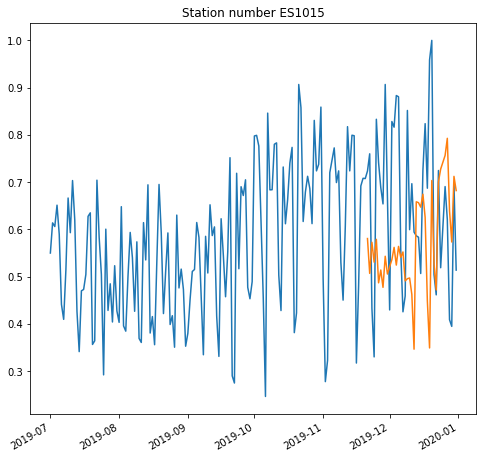

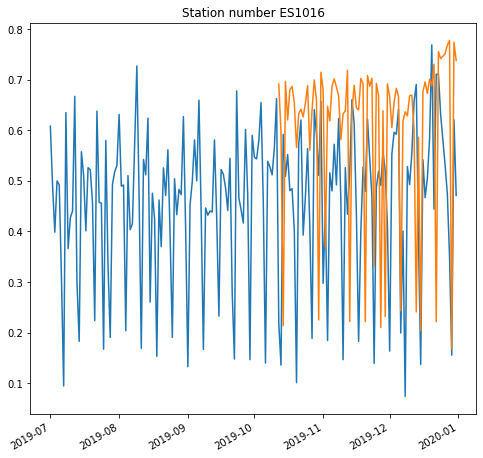

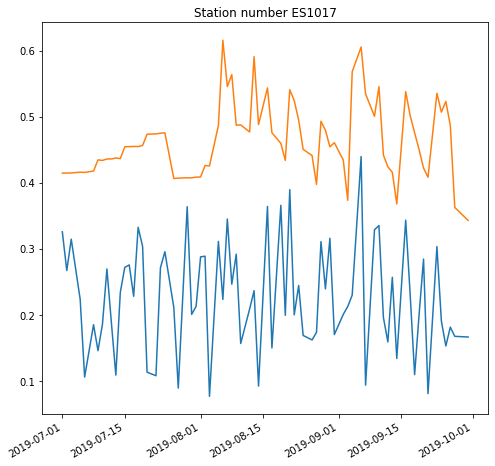

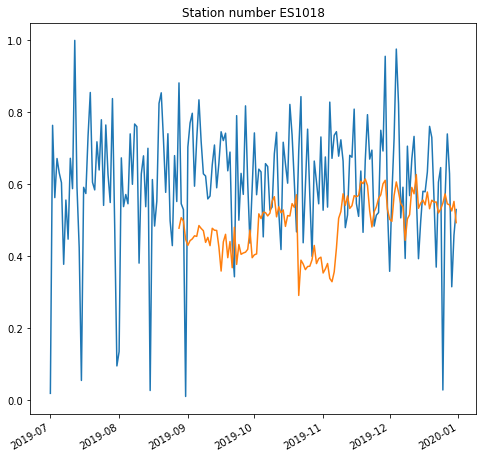

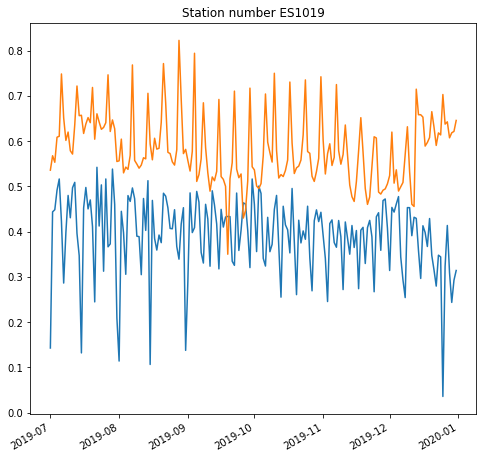

...

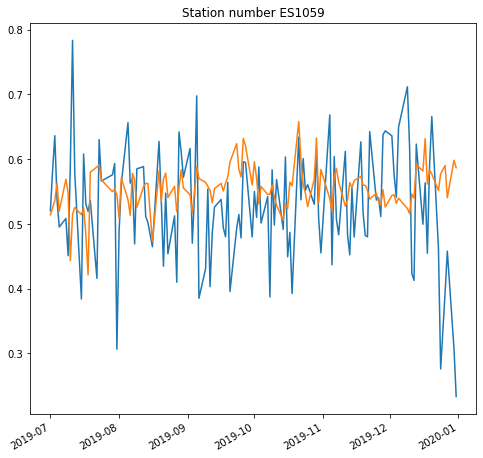

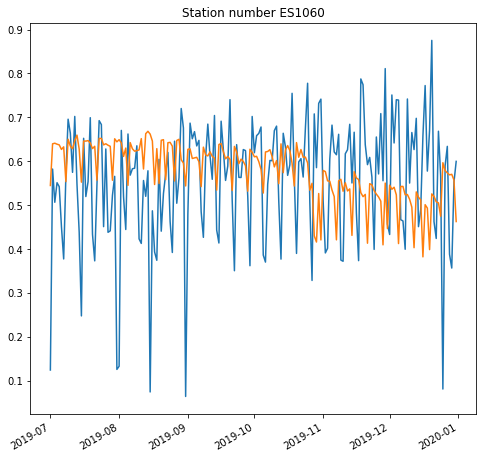

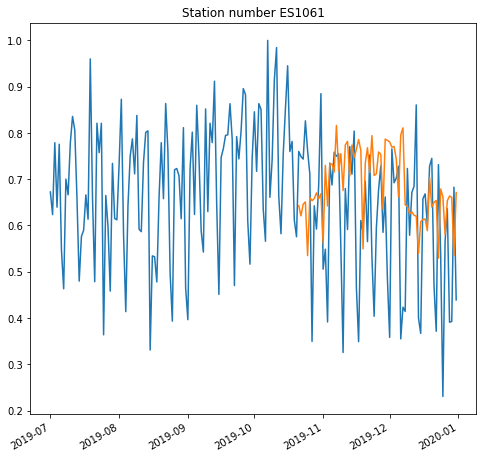

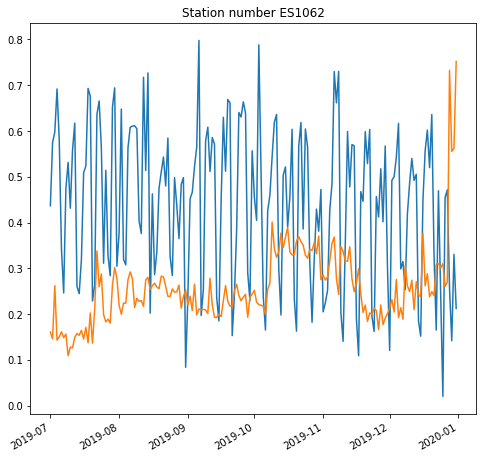

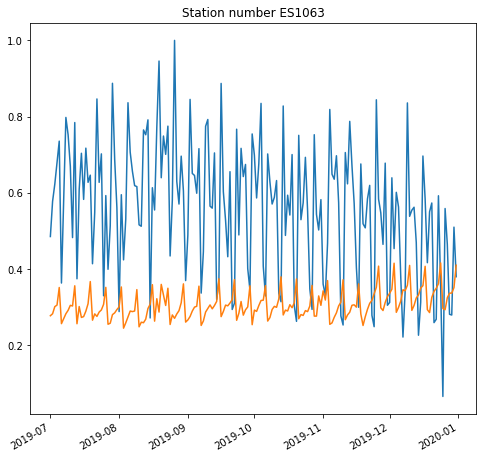

In [400]:
for stations in range(0,len(code_arr_scaled)): 
    df3 = code_arr_scaled[stations]
    predictio = rmsepd[rmsepd.station == df3.iloc[1,1]]
    all_pred = []
    for pred in predictio['predictions']:
        for el in pred:
            all_pred.append(el)
    df3_plot = df3[(df3.Year == 2019) & (df3.Month > 6)]
    lprediction = len(all_pred)
    ldataset = len(df3_plot)
    if lprediction < ldataset:
        startindex = ldataset - lprediction
    else:
        all_pred = all_pred[0:ldataset]
        startindex = 0
    df3_pred = df3_plot.iloc[startindex:ldataset,:].copy()
    df3_pred.loc[:,'Diesel demand'] = all_pred
    x = df3_plot['Date']
    y = df3_plot['Diesel demand']
    x2 = df3_pred.loc[:,'Date']
    y2 = df3_pred.loc[:,'Diesel demand']
    plt.plot(x,y)
    plt.plot(x2,y2)
    plt.title('Station number ' + str(df3.iloc[1,1]))
    # beautify the x-labels
    plt.gcf().autofmt_xdate()
    plt.show()

In [401]:
rmsepd.to_csv(r'C:\Users\Pierre Computer\Documents\IE_classes\Competition_repsol\complete_pred.csv', index = False)

In [402]:
groupedtest = rmsepd.groupby("station").agg({"score":"mean"})
groupedtest = groupedtest.reset_index(inplace=False)
groupedtest

,station,score
0,ES1015,0.119324
1,ES1016,0.123055
2,ES1017,0.172252
3,ES1018,0.137433
4,ES1019,0.089037
5,ES1020,0.117572
6,ES1021,0.082145
7,ES1023,0.134568
8,ES1024,0.061863
9,ES1025,0.105723


In [403]:
groupedtest['score'].describe()

count    43.000000
mean      0.108615
std       0.025386
min       0.051288
25%       0.090334
50%       0.109470
75%       0.122447
max       0.172252
Name: score, dtype: float64

In [404]:
groupedtest = groupedtest.rename(columns={"score": "test_score"})
complete_model = bestmods.merge(groupedtest, on = 'station', how = 'left')
complete_model.to_csv(r'C:\Users\Pierre Computer\Documents\IE_classes\Competition_repsol\bestmodel_splits_score_test.csv', index = False)
complete_model

,score_mean,model,score_deviation,Splits,station,test_score
0,0.025416,Random Forest Regressor,0.015380,4,ES1015,0.119324
1,0.031404,Random Forest Regressor,0.018273,5,ES1016,0.123055
2,0.029379,Bayesian Ridge,0.012021,4,ES1017,0.172252
3,0.013153,Random Forest Regressor,0.013295,7,ES1018,0.137433
4,0.004788,Random Forest Regressor,0.005140,9,ES1019,0.089037
5,0.011666,Random Forest Regressor,0.006167,4,ES1020,0.117572
6,0.005534,Ridge,0.003194,6,ES1021,0.082145
7,0.001807,Random Forest Regressor,0.001380,6,ES1023,0.134568
8,0.001604,Random Forest Regressor,0.001230,9,ES1024,0.061863
9,0.002483,Ridge,0.003911,7,ES1025,0.105723


In [405]:
complete_model

,score_mean,model,score_deviation,Splits,station,test_score
0,0.025416,Random Forest Regressor,0.015380,4,ES1015,0.119324
1,0.031404,Random Forest Regressor,0.018273,5,ES1016,0.123055
2,0.029379,Bayesian Ridge,0.012021,4,ES1017,0.172252
3,0.013153,Random Forest Regressor,0.013295,7,ES1018,0.137433
4,0.004788,Random Forest Regressor,0.005140,9,ES1019,0.089037
5,0.011666,Random Forest Regressor,0.006167,4,ES1020,0.117572
6,0.005534,Ridge,0.003194,6,ES1021,0.082145
7,0.001807,Random Forest Regressor,0.001380,6,ES1023,0.134568
8,0.001604,Random Forest Regressor,0.001230,9,ES1024,0.061863
9,0.002483,Ridge,0.003911,7,ES1025,0.105723


In [406]:
featureImportance

,variable,ES1015,ES1016,ES1017,ES1018,ES1019,ES1020,ES1021,ES1023,ES1024,ES1025,ES1026,ES1027,ES1028,ES1029,ES1030,ES1031,ES1032,ES1033,ES1034,ES1037,ES1038,ES1039,ES1040,ES1041,ES1042,ES1043,ES1046,ES1048,ES1049,ES1050,ES1051,ES1052,ES1053,ES1054,ES1055,ES1056,ES1057,ES1058,ES1059,ES1060,ES1061,ES1062,ES1063
0,Gasoline price,0.032,0.035,0.000,0.043,0.041,0.082,0.133,0.024,0.015,0.682,0.048,0.217,0.022,0.010,0.016,0.017,0.012,0.193,0.022,0.049,0.018,0.096,0.047,0.037,0.014,0.205,0.006,1.234,0.322,0.020,0.000,0.016,0.027,0.041,0.001,0.022,0.022,0.967,0.027,0.165,0.994,0.031,0.201
1,dateunix,0.042,0.021,0.000,0.082,0.138,0.054,0.069,0.038,0.073,0.019,0.103,0.170,0.225,0.136,0.038,0.205,0.166,0.073,0.051,0.189,0.131,0.064,0.060,0.040,0.134,0.196,0.023,0.046,0.067,0.088,0.001,0.051,0.207,0.083,0.000,0.061,0.054,0.059,0.089,0.023,0.027,0.145,0.084
2,Month,0.002,0.002,0.000,0.003,0.007,0.006,0.005,0.001,0.002,0.000,0.005,0.008,0.014,0.009,0.006,0.014,0.004,0.005,0.005,0.006,0.002,0.003,0.003,0.002,0.004,0.012,0.001,0.000,0.000,0.002,0.001,0.006,0.005,0.001,0.002,0.006,0.003,0.000,0.005,0.002,0.005,0.003,0.006
3,Weekday,0.271,0.334,0.001,0.066,0.250,0.081,0.005,0.113,0.181,0.005,0.236,0.001,0.244,0.203,0.497,0.161,0.087,0.009,0.171,0.048,0.043,0.112,0.265,0.127,0.158,0.009,0.242,0.001,0.005,0.116,0.027,0.222,0.034,0.057,0.012,0.043,0.254,0.001,0.044,0.002,0.006,0.057,0.010
4,Day,0.050,0.035,0.001,0.060,0.072,0.063,0.000,0.090,0.085,0.000,0.079,0.000,0.049,0.122,0.029,0.072,0.051,0.000,0.034,0.086,0.152,0.048,0.039,0.061,0.088,0.001,0.051,0.001,0.001,0.072,0.000,0.085,0.057,0.072,0.000,0.069,0.106,0.001,0.103,0.000,0.000,0.091,0.000
5,Sunday,0.002,0.267,0.000,0.007,0.042,0.035,0.078,0.002,0.003,0.017,0.067,0.141,0.021,0.046,0.013,0.033,0.003,0.043,0.022,0.002,0.026,0.000,0.164,0.106,0.115,0.090,0.169,0.000,0.042,0.076,0.010,0.043,0.007,0.013,0.011,0.012,0.195,0.036,0.000,0.062,0.103,0.012,0.047
6,median temperature,0.035,0.025,0.000,0.076,0.052,0.063,0.012,0.190,0.075,0.002,0.114,0.002,0.083,0.057,0.042,0.054,0.117,0.011,0.044,0.115,0.062,0.182,0.041,0.073,0.058,0.021,0.035,0.005,0.013,0.124,0.001,0.106,0.089,0.060,0.006,0.104,0.063,0.007,0.121,0.002,0.004,0.116,0.011
7,precipitation,0.043,0.025,0.000,0.111,0.052,0.139,0.005,0.150,0.021,0.007,0.027,0.011,0.031,0.031,0.040,0.060,0.050,0.004,0.177,0.060,0.031,0.061,0.035,0.212,0.028,0.003,0.040,0.002,0.004,0.069,0.015,0.049,0.045,0.035,0.007,0.028,0.031,0.011,0.117,0.003,0.001,0.102,0.003
8,wind median vel,0.039,0.013,0.000,0.073,0.059,0.161,0.010,0.096,0.084,0.004,0.052,0.005,0.058,0.044,0.079,0.050,0.076,0.003,0.165,0.073,0.096,0.174,0.052,0.028,0.037,0.001,0.052,0.003,0.005,0.061,0.012,0.047,0.149,0.157,0.004,0.101,0.040,0.001,0.084,0.005,0.002,0.054,0.004
9,holiday,0.002,0.131,0.000,0.032,0.001,0.001,0.087,0.011,0.001,0.004,0.003,0.110,0.005,0.027,0.039,0.002,0.015,0.017,0.002,0.002,0.015,0.000,0.004,0.000,0.017,0.096,0.001,0.000,0.000,0.000,0.001,0.002,0.010,0.034,0.021,0.038,0.000,0.022,0.000,0.042,0.071,0.000,0.028


In [407]:
for col in featureImportance.columns:
        print(col)

variable
ES1015
ES1016
ES1017
ES1018
ES1019
ES1020
ES1021
ES1023
ES1024
ES1025
ES1026
ES1027
ES1028
ES1029
ES1030
ES1031
ES1032
ES1033
ES1034
ES1037
ES1038
ES1039
ES1040
ES1041
ES1042
ES1043
ES1046
ES1048
ES1049
ES1050
ES1051
ES1052
ES1053
ES1054
ES1055
ES1056
ES1057
ES1058
ES1059
ES1060
ES1061
ES1062
ES1063


In [408]:
predictions_dfs_dict[predictions_dfs_dict.station == 'ES1015']

,predictions,station,values
0,"[0.5803894677758217, 0.5066421034932137, 0.572...",ES1015,1301 0.393333 1302 0.428070 1303 0.64...


In [409]:
code_arr_scaled[0]

,Date,Code,Gasoline demand,Gasoline price,Diesel demand,Diesel price,dateunix,Month,Weekday,Day,Year,Sunday,median temperature,precipitation,wind median vel,gusts of wind,holiday,city,brent_diff_day,volatility,temp_diff,Lagprice,season_Fall,season_Spring,season_Summer,season_Winter,Gas elasticity,Diesel elasticity
1262,2019-06-18,ES1015,0.515439,1.329,0.520213,1.219,-1.722205,6,1,18,2019,0,0.314193,-0.237166,4.7,0.211770,0,1,-1.227965,0.969305,-0.005834,-0.540137,0,0,1,0,NaN,NaN
1263,2019-06-19,ES1015,0.558246,1.319,0.618617,1.219,-1.704547,6,2,19,2019,0,0.314193,-0.354034,1.4,-0.583888,0,1,0.617164,-0.520115,-1.149279,-0.107748,0,0,1,0,-0.103233,-0.251434
1264,2019-06-20,ES1015,0.627719,1.319,0.549468,1.229,-1.686889,6,3,20,2019,0,0.044216,-0.500120,5.3,0.211770,0,1,-2.042296,0.793471,-1.201254,-0.223052,0,0,1,0,-0.250802,0.422554
1265,2019-06-21,ES1015,0.564211,1.329,0.656383,1.229,-1.669231,6,4,21,2019,0,0.098211,-0.500120,3.1,-0.473380,0,1,-0.331170,0.110820,0.565889,0.724600,0,0,1,0,0.437071,-0.287745
1266,2019-06-22,ES1015,0.435439,1.329,0.498404,1.229,-1.651573,6,5,22,2019,0,0.773153,-0.354034,1.9,-0.650193,0,1,0.679012,0.059104,1.137612,0.994843,0,0,1,0,0.815120,0.620696
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2019-12-27,ES1015,0.644912,1.339,0.620479,1.275,1.668150,12,4,27,2019,0,-1.629642,-0.500120,1.7,-1.202734,0,1,-0.238399,-0.923500,1.813284,1.974924,0,0,0,1,-0.713395,0.408495
1455,2019-12-28,ES1015,0.447018,1.339,0.408511,1.269,1.685808,12,5,28,2019,0,-1.062690,-0.500120,1.7,-1.269038,0,1,-0.228091,-0.851097,2.592906,2.061402,0,0,0,1,0.960773,0.857408
1456,2019-12-29,ES1015,0.342456,1.339,0.394415,1.269,1.703466,12,6,29,2019,1,-0.576731,-0.500120,1.7,-1.136429,0,1,-0.228091,-0.851097,1.553410,2.162293,0,0,0,1,1.068550,0.467586
1457,2019-12-30,ES1015,0.710526,1.339,0.696277,1.269,1.721124,12,0,30,2019,0,-0.981697,-0.500120,1.4,-1.202734,0,1,-0.228091,-0.851097,1.293536,2.162293,0,0,0,1,-3.199980,-1.604821


In [ ]:
#predictions_dfs_dict.to_csv(r'C:\Users\Pierre Computer\Documents\IE_classes\Competition_repsol\predictions.csv', index = False)

# Diesel Demand

## Model for each station

In [411]:
#Predict gasoline demand using global dataset (not considering location)
score_dict = {}
score_dictA = {}
result_df = pd.DataFrame(columns = {"Splits",'model','station','score_mean', 'score_deviation'})
for stations in range(0,len(code_arr_scaled)): 
    df3 = code_arr_scaled[stations]
    print(df3.iloc[1,1])
    df1_regr = pd.DataFrame()
    for col in df3.columns:
        try:
            if (col == "Date"):
                continue
            df1_regr[col] = pd.to_numeric(df3[col], downcast="float")
        except:
            #print(col)
            continue
    df1_regr = df1_regr.drop(['Year','gusts of wind'],axis=1)
    X = df1_regr.loc[:, (df1_regr.columns != dd) & (df1_regr.columns != gd) & (df1_regr.columns != 'Diesel elasticity') & (df1_regr.columns != 'Gas elasticity') & (df1_regr.columns != target) ]
    y = df1_regr.loc[:,dd]
    mod = ["Ridge ","Bayesian Ridge ","Random Forest Regressor"]
    count = 0
    for model in [Ridge(normalize=True),BayesianRidge(),RandomForestRegressor(random_state=42, max_features='auto')]:
        #print('Our model is ' + str(mod[count]))
        for i in range(4,20):
            btscv = BlockingTimeSeriesSplit(n_splits=i)
            #print("Number of splits: " + str(i))
            for train_index, test_index in btscv.split(X):
                X_train, X_test = X.iloc[train_index], X.iloc[test_index]
                y_train, y_test = y.iloc[train_index], y.iloc[test_index]
            scores = cross_val_score(model, X_train, y_train, cv=btscv, scoring='neg_mean_squared_error')
            score_dict[str(i)+ "/ " + str(mod[count]) + "/ station code/" + str(stations)] = scores.mean()
            score_dictA[str(i)+ "/ " + str(mod[count]) + "/ station code/" + str(stations)] = abs(scores.mean())
            result_df = result_df.append({"Splits": i,
                                         "model": mod[count],
                                         'station':df3.iloc[1,1],
                                          "score_mean": abs(scores.mean()),
                                          'score_deviation': scores.std()
                                         },ignore_index=True) 
        count += 1

ES1015


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1016


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1017


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1018


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1019
ES1020


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1021
ES1023


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1024


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1025


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1026
ES1027
ES1028
ES1029
ES1030
ES1031
ES1032
ES1033
ES1034


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1037
ES1038
ES1039


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1040


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1041


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1042
ES1043


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1046


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1048


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1049


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1050


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1051


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1052
ES1053
ES1054
ES1055


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1056
ES1057
ES1058


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1059
ES1060
ES1061


C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape=(0, 19)) while a minimum of 1 is required.

  FitFailedWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Found array with 0 sample(s) (shape

ES1062
ES1063


In [412]:
grouped = result_df.groupby("station").agg({"score_mean":"min"})
bestmods = grouped.merge(result_df, on = 'score_mean', how = 'left')
models_d = {"Ridge ":Ridge(normalize=True),"Bayesian Ridge ":BayesianRidge(),"Random Forest Regressor":RandomForestRegressor(random_state=42, max_features='auto')}

In [413]:
def get_feature_importance(clf, feature_names,station):
    return pd.DataFrame({'variable': feature_names, # Feature names
                         station: abs(clf.coef_)# Feature Coeficients
                    }) \
    .round(decimals=3) 
   
def get_feature_importance_regr(clf, feature_names,station):
    return pd.DataFrame({'variable': feature_names, # Feature names
                         station: clf.feature_importances_# Feature Coeficients
                    }) \
    .round(decimals=3) 
rmse = {}
rmsepd = pd.DataFrame(columns = {"station","split","score","predictions"})
featureImportance = pd.DataFrame(columns ={ "variable" })
featureImportance["variable"] = X_test.columns  
predictions_dfs_dict =  pd.DataFrame(columns ={ "station","predictions","values"})
for stations in range(0,len(code_arr_scaled)): 
    df3 = code_arr_scaled[stations]
    print(df3.iloc[1,1])
    df1_regr = pd.DataFrame()
    for col in df3.columns:
        try:
            if (col == "Date"):
                continue
            df1_regr[col] = pd.to_numeric(df3[col], downcast="float")
        except:
            #print(col)
            continue
    df1_regr = df1_regr.drop(['Year','gusts of wind'],axis=1)
    X = df1_regr.loc[:, (df1_regr.columns != dd) & (df1_regr.columns != gd) & (df1_regr.columns != 'Diesel elasticity') 
                     & (df1_regr.columns != 'Gas elasticity') & (df1_regr.columns != target)]
    y = df1_regr.loc[:,dd]
    btscv = BlockingTimeSeriesSplit(n_splits= bestmods.loc[stations,'Splits'])
    count = 0
    for train_index, test_index in btscv.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        if (bestmods.loc[stations,'model'] == "Ridge "):
            grid = {
                "alpha": [0.0001 ,0.001,0.01,0.01,0.1,1.0]
            }
            grid_search = GridSearchCV(models_d[bestmods.loc[stations,'model']], param_grid = grid)
            grid_search.fit(X_train, y_train)
            optimal_model = grid_search.best_estimator_
        else:
            optimal_model = models_d[bestmods.loc[stations,'model']]
        # predicting
        optimal_model.fit(X_train,y_train)
        predictions = optimal_model.predict(X_test)
        if (count == 0):
            predictions_dfs_dict = predictions_dfs_dict.append({"station": df3.iloc[1,1],
                                         "predictions": predictions 
                                           ,"values": y_test
                                                               },ignore_index=True) 
        # evaluating the model with RMSE metric
        scoring = np.sqrt(mean_squared_error(y_test,predictions))
        rmse["station /" + str(stations)  + str(count)] = scoring
        rmsepd = rmsepd.append({"station": df3.iloc[1,1],
                                         "split": count+1,
                                         'score': scoring,
                                         "predictions": np.transpose(predictions) 
                                         },ignore_index=True)
        count += 1
    if (bestmods.loc[stations,'model'] == "Random Forest Regressor"):
        df_rf = get_feature_importance_regr(optimal_model, X_test.columns,df3.iloc[1,1])
        featureImportance = featureImportance.merge(df_rf, on = "variable", how = "left")
    else:
        df_r = get_feature_importance(optimal_model, X_test.columns,df3.iloc[1,1])
        featureImportance = featureImportance.merge(df_r, on = "variable", how = "left")

ES1015
ES1016
ES1017
ES1018
ES1019
ES1020
ES1021
ES1023
ES1024
ES1025
ES1026
ES1027
ES1028
ES1029
ES1030
ES1031
ES1032
ES1033
ES1034
ES1037
ES1038
ES1039
ES1040
ES1041
ES1042
ES1043
ES1046
ES1048
ES1049
ES1050
ES1051
ES1052
ES1053
ES1054
ES1055
ES1056
ES1057
ES1058
ES1059
ES1060
ES1061
ES1062
ES1063


## Graph last 6 month of 2019: predicted time varying across station 

**Note** As we  predict for diffent time frame  the Line of prediction size can vary

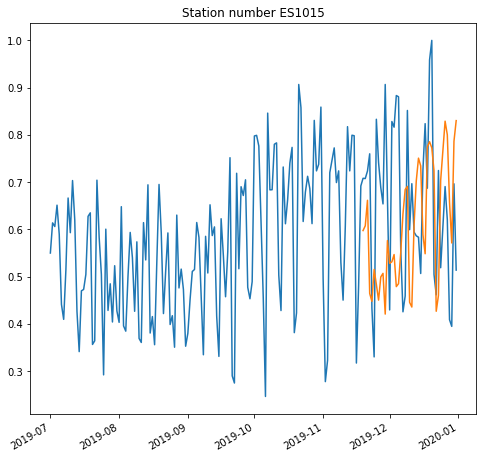

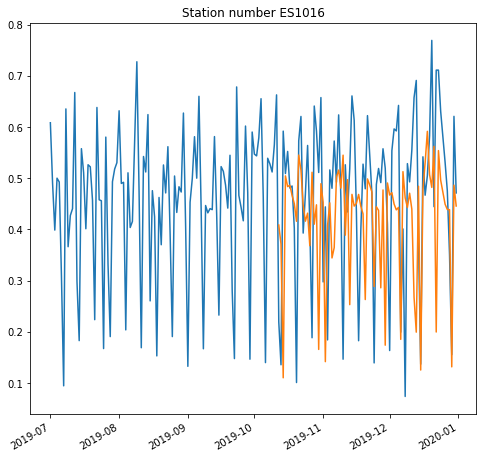

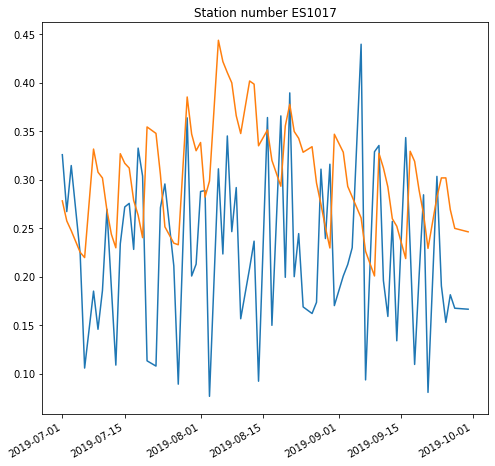

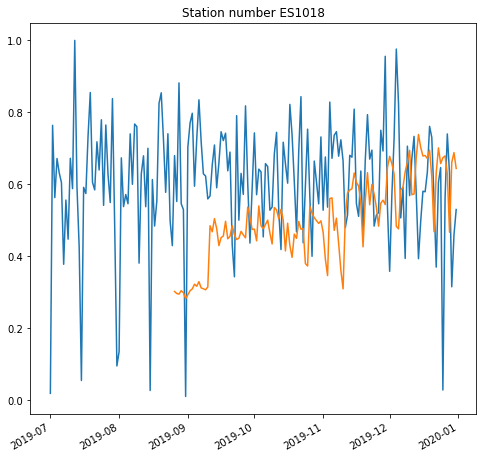

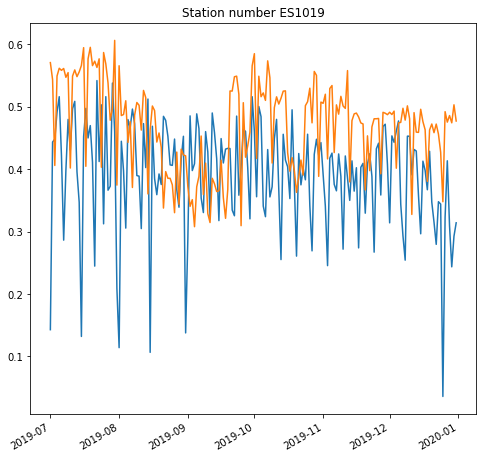

...

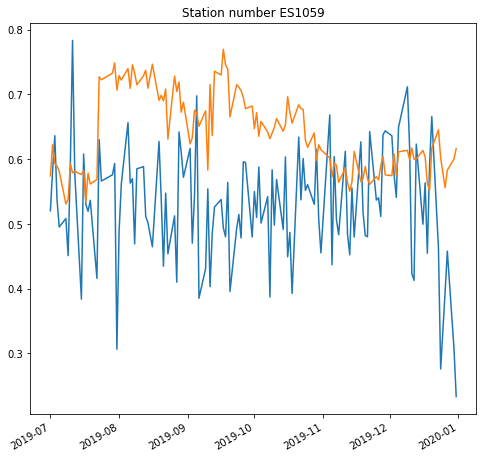

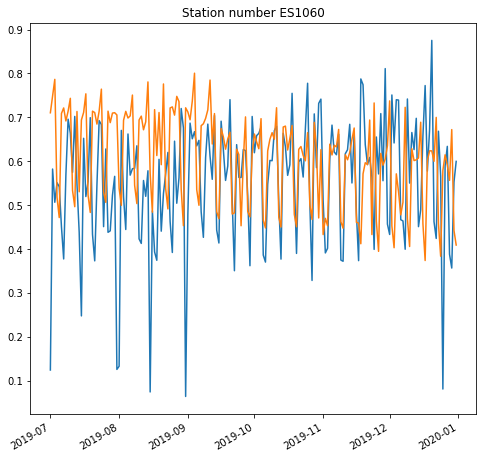

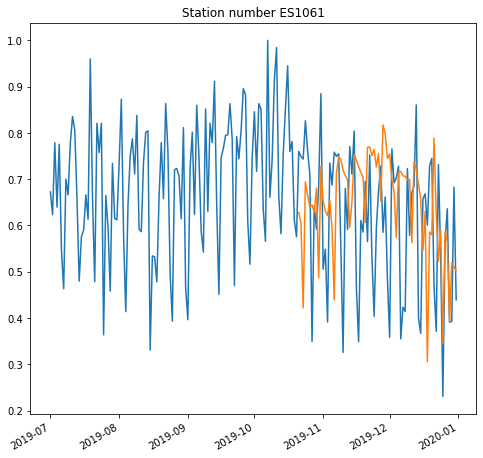

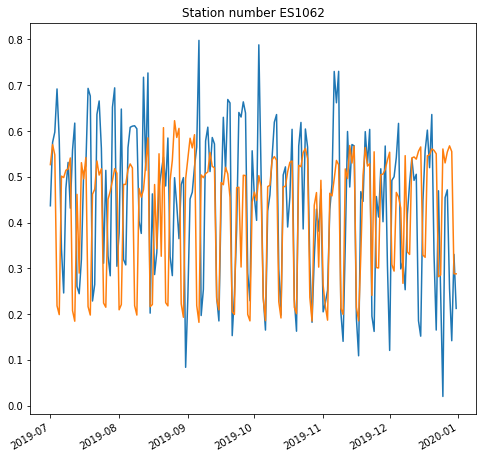

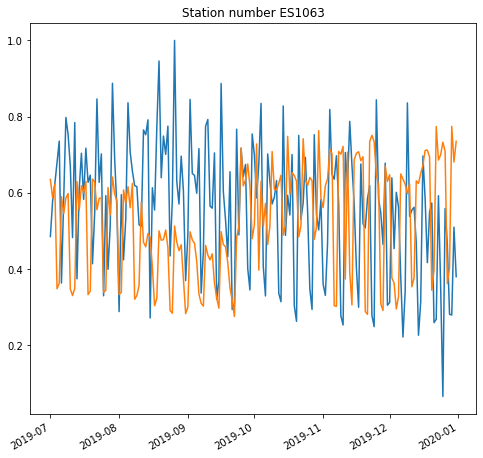

In [414]:
for stations in range(0,len(code_arr_scaled)): 
    df3 = code_arr_scaled[stations]
    predictio = rmsepd[rmsepd.station == df3.iloc[1,1]]
    all_pred = []
    for pred in predictio['predictions']:
        for el in pred:
            all_pred.append(el)
    df3_plot = df3[(df3.Year == 2019) & (df3.Month > 6)]
    lprediction = len(all_pred)
    ldataset = len(df3_plot)
    if lprediction < ldataset:
        startindex = ldataset - lprediction
    else:
        all_pred = all_pred[0:ldataset]
        startindex = 0
    df3_pred = df3_plot.iloc[startindex:ldataset,:].copy()
    df3_pred.loc[:,'Diesel demand'] = all_pred
    x = df3_plot['Date']
    y = df3_plot['Diesel demand']
    x2 = df3_pred.loc[:,'Date']
    y2 = df3_pred.loc[:,'Diesel demand']
    plt.plot(x,y)
    plt.plot(x2,y2)
    plt.title('Station number ' + str(df3.iloc[1,1]))
    # beautify the x-labels
    plt.gcf().autofmt_xdate()
    plt.show()

In [2]:
#rmsepd.to_csv(r'C:\Users\Pierre Computer\Documents\IE_classes\Competition_repsol\complete_pred_Diesel.csv', index = False)

In [4]:
#featureImportance.to_csv(r'C:\Users\Pierre Computer\Documents\IE_classes\Competition_repsol\featureimportance.csv', index = False)
#featureImportance.to_csv(r'C:\Users\Pierre Computer\Documents\IE_classes\Competition_repsol\featureimportanceDiesel.csv', index = False)

In [ ]:
groupedtest = rmsepd.groupby("station").agg({"score":"min"})
groupedtest = groupedtest.reset_index(inplace=False)

In [ ]:
groupedtest = groupedtest.rename(columns={"score": "test_score"})
complete_model = bestmods.merge(groupedtest, on = 'station', how = 'left')
complete_model.to_csv(r'C:\Users\Pierre Computer\Documents\IE_classes\Competition_repsol\bestmodel_splits_score_testfeatureimportanceDiesel.csv', index = False)

## SARIMA Model 

- Make the dataset 3 months old 

In [65]:
dfshort = df1.copy()
dfshort['Date'] = pd.to_datetime(dfshort['Date'])  
mask = (dfshort['Date'] > '2019-09-01')
dfshort = dfshort.loc[mask]

unique_code = np.unique(df1['Code'])
code_arr2 = []
df_open = pd.DataFrame()

for codes in unique_code:
    code_arr2.append(dfshort[dfshort.Code == codes])
code_arr_el2 = []
for stations in range(0,len(code_arr2)): 
    df4 = code_arr2[stations].copy()
    df4 = df4.fillna(method='ffill', axis=1)
    #Getting rid of non opened day and outliers (values under 0)
    df4.loc[(df4['Diesel demand'] == 0) & (df4['Gasoline demand'] == 0) | (df4['Diesel demand'] < 0) | (df4['Gasoline demand'] < 0), ['Diesel demand','Gasoline demand']] = np.NaN
    df4 = df4.dropna()
    #Elasticity of demand or each station
    change_priceD = (((df4['Diesel price']*10)- (df4['Diesel price']*10).shift(1)-1)/ ((df4['Diesel price']*10).shift(1)-1))*100
    change_demandD = (((df4['Diesel demand']*10)- (df4['Diesel demand']*10).shift(1)-1)/ ((df4['Diesel demand']*10).shift(1)-1))*100
    change_priceG = (((df4['Gasoline price']*10)- (df4['Gasoline price']*10).shift(1)-1)/((df4['Gasoline price']*10).shift(1)-1))*100
    change_demandG = (((df4['Gasoline demand']*10)- (df4['Gasoline demand']*10).shift(1)-1)/ ((df4['Gasoline demand']*10).shift(1)-1))*100
    df4['Gas elasticity'] = change_demandG/change_priceG;
    df4['Diesel elasticity'] = change_demandD/ change_priceD;
    print("Station ",df4.iloc[1,1], " "  ,len(df4) , " open days")
    df4 = df4.drop(['Longitude','Latitude'],axis = 1)
    df_open = df_open.append({"station": df4.iloc[1,1],
                                     "Open days": len(df4),
                                     },ignore_index=True) 
    code_arr_el2.append(df4)

Station  ES1015   120  open days
Station  ES1016   120  open days
Station  ES1017   23  open days
Station  ES1018   121  open days
Station  ES1019   121  open days
Station  ES1020   121  open days
Station  ES1021   121  open days
Station  ES1023   121  open days
Station  ES1024   121  open days
Station  ES1025   121  open days
Station  ES1026   121  open days
Station  ES1027   121  open days
Station  ES1028   121  open days
Station  ES1029   121  open days
Station  ES1030   121  open days
Station  ES1031   121  open days
Station  ES1032   121  open days
Station  ES1033   121  open days
Station  ES1034   121  open days
Station  ES1037   120  open days
Station  ES1038   121  open days
Station  ES1039   100  open days
Station  ES1040   121  open days
Station  ES1041   121  open days
Station  ES1042   115  open days
Station  ES1043   121  open days
Station  ES1046   121  open days
Station  ES1048   120  open days
Station  ES1049   120  open days
Station  ES1050   121  open days
Station  ES

In [66]:
code_arr_scaled2 = []
for stations in range(0,len(code_arr2)):
    df6 = code_arr_el2[stations]
    df1_scaled = df6.copy()
    df6.drop(['city'],axis =1)
    for col in df6.columns: 
        if (df1_scaled[col].nunique() > 31) & (col != 'Date') & (col != 'Gasoline demand') & (col != 'Gasoline price') & (col != 'Diesel demand') & (col != 'Diesel price'):
            dat = df1_scaled.loc[:,col]
            try:
                dat = dat.apply(float)
            except:
                continue
            scaler = StandardScaler()
            dat = pd.DataFrame(dat)
            scaler.fit(dat)
            df_scaling = scaler.transform(dat)
            df1_scaled.loc[:,col] = df_scaling
        else: 
            continue
    code_arr_scaled2.append(df1_scaled)

### Gasoline demand prediction using SARIMA 

In [67]:
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX
steps = 7
rmseARIMAs = []
result_df = pd.DataFrame()
for stations in range(0,len(code_arr_scaled2)): 
    df4 = code_arr_scaled2[stations]
    df1_regr = pd.DataFrame()
    for col in df4.columns:
        try:
            if (col == "Date"):
                continue
            df1_regr[col] = pd.to_numeric(df4[col], downcast="float")
        except:
            #print(col)
            continue
    X = df1_regr.loc[:, (df1_regr.columns != dd) & (df1_regr.columns != gd)  ]
    y = df1_regr.loc[:,gd]
    train_X, train_y = X[7:len(X)], y[7:len(X)] 
    test_X, test_y = X[len(X)-7:].dropna(), y[len(X)-7:].dropna()
    model= SARIMAX(train_y, 
     exog=train_X,
     order=(0,0,0), seasonal_order= (0,0,0,12),
    enforce_invertibility=True, enforce_stationarity=True)
    results=model.fit()
    forecast = results.forecast(steps=7, exog = test_X)
    train_size = len(test_X)
    test_size = 7
    steps = -7
    rmse = np.sqrt(mean_squared_error(forecast, test_y))
    rmseARIMAs.append(rmse)
    result_df = result_df.append({'station':df4.iloc[1,1],
                                          "score_mean": rmse, "predictions": forecast },ignore_index=True) 

C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:583: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)
C:\Users\Pierre Computer\Documents\Python\Anaconda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:214: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
C:

In [68]:
result_df

,predictions,score_mean,station
0,113 0.612670 114 0.555258 115 0.66475...,0.069589,ES1015
1,113 0.713770 114 0.697410 115 0.71763...,0.088421,ES1016
2,16 0.169675 17 0.534855 18 0.453193 1...,0.000676,ES1017
3,114 0.269473 115 0.416370 116 0.67915...,0.090443,ES1018
4,114 0.434722 115 0.414152 116 0.60393...,0.042884,ES1019
5,114 0.531115 115 0.751924 116 0.75725...,0.071399,ES1020
6,114 0.298291 115 0.634705 116 0.46548...,0.060087,ES1021
7,114 0.382279 115 0.572637 116 0.66036...,0.067934,ES1023
8,114 0.210202 115 0.231885 116 0.24463...,0.053888,ES1024
9,114 0.247803 115 0.455953 116 0.44628...,0.071925,ES1025


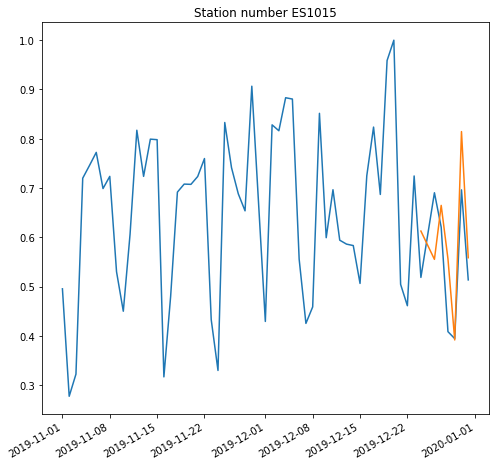

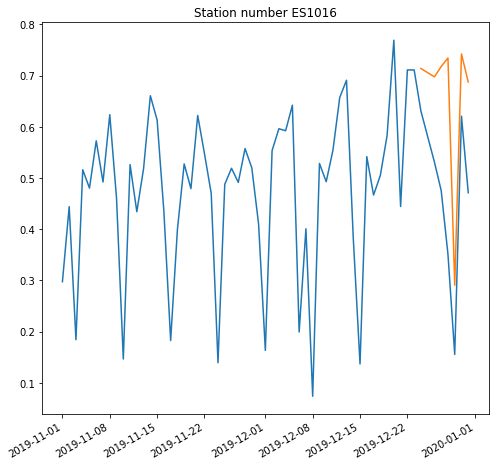

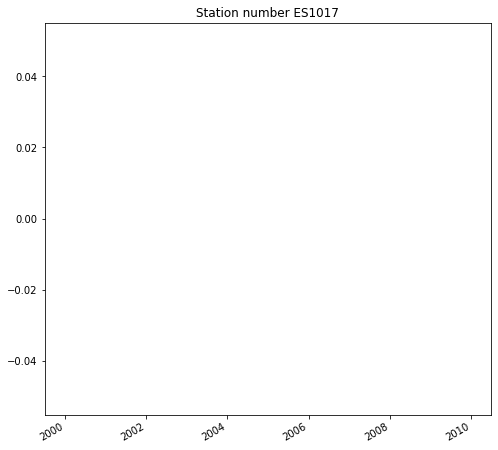

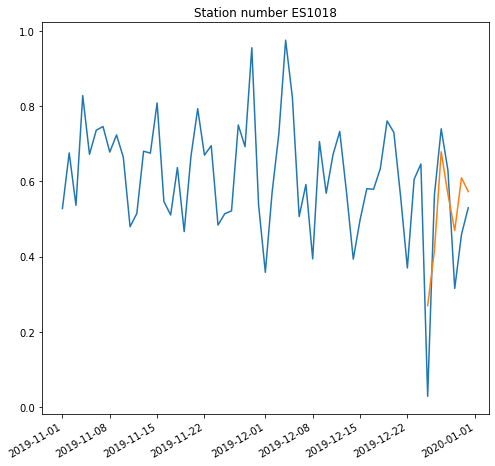

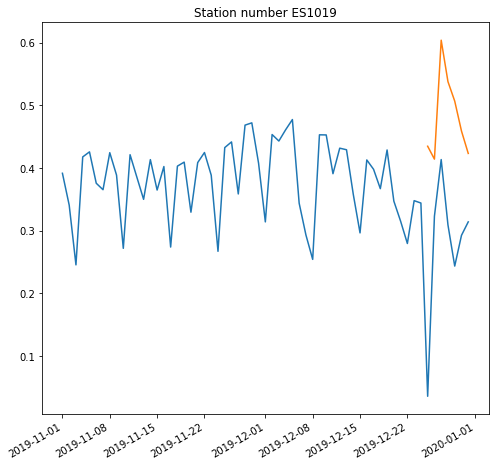

...

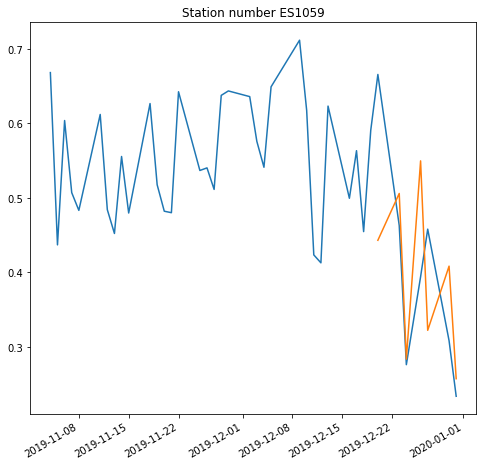

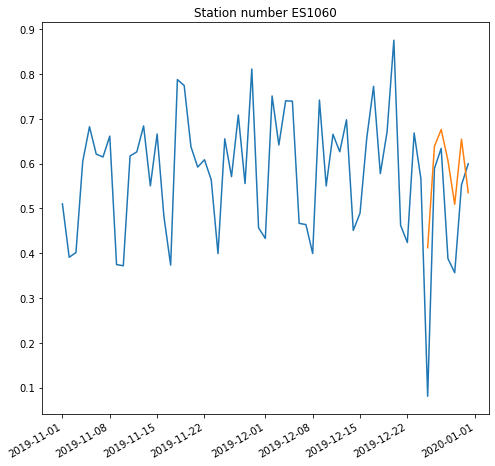

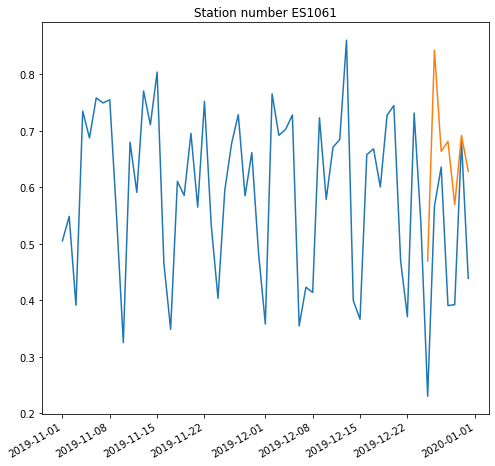

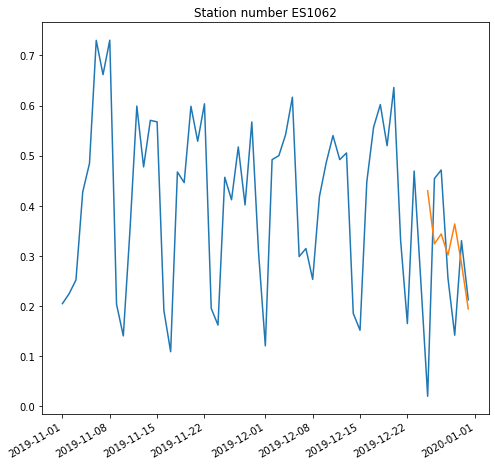

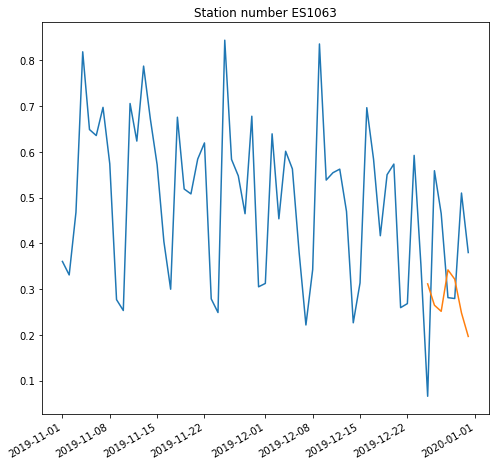

In [71]:
for stations in range(0,len(code_arr_scaled2)): 
    df3 = code_arr_scaled[stations]
    predictio = result_df[result_df.station == df3.iloc[1,1]]
    all_pred = []
    for pred in predictio['predictions']:
        for el in pred:
            all_pred.append(el)
    df3_plot = df3[(df3.Year == 2019) & (df3.Month > 10)]
    lprediction = len(all_pred)
    ldataset = len(df3_plot)
    if lprediction < ldataset:
        startindex = ldataset - lprediction
    else:
        all_pred = all_pred[0:ldataset]
        startindex = 0
    df3_pred = df3_plot.iloc[startindex:ldataset,:].copy()
    df3_pred.loc[:,'Diesel demand'] = all_pred
    x = df3_plot['Date']
    y = df3_plot['Diesel demand']
    x2 = df3_pred.loc[:,'Date']
    y2 = df3_pred.loc[:,'Diesel demand']
    plt.plot(x,y)
    plt.plot(x2,y2)
    plt.title('Station number ' + str(df3.iloc[1,1]))
    # beautify the x-labels
    plt.gcf().autofmt_xdate()
    plt.show()

END